<a href="https://colab.research.google.com/github/Ujjwalrai7/Capestone-Project-Bike-sharing-demand-prediction/blob/main/Capestone_Project_Bike_Sharing_Demand_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - **Bike Sharing Demand Prediction**


##### **Project Type**    - Regression
##### **Contribution**    - Individual Project By Ujjwal Manoj Rai


# **Project Summary -**

Bike rental companies often face the challenge of accurately predicting bike demand, which is crucial for optimizing inventory management and pricing strategies. In this project, my goal was to develop a regression supervised machine learning model that could forecast the demand for bikes within a specific time period.

Initially, I obtained a dataset from a bike sharing company containing valuable information such as the number of bikes rented, rental timestamps, and various weather and seasonality features. The dataset also included details on other factors that could potentially impact bike demand, such as holidays and functional/non-functional days.

To ensure the data was ready for modeling, I conducted thorough preprocessing and cleaning. This involved handling missing values, transforming variables as necessary, and encoding categorical features. Once the data was prepared, I split it into training and test sets, reserving the latter for evaluating the model's performance.

Next, I experimented with different model architectures and hyperparameter settings to find the best performing model. I trained each model using the training dataset and assessed their performance on the test data. By comparing various metrics such as mean absolute error, root mean squared error, and R-squared, I identified the model that exhibited superior predictive accuracy.

Additionally, I conducted ablation studies to gain insights into the individual impact of features on the model's performance. By selectively removing or modifying certain features, I assessed their significance in predicting bike demand. Notably, I discovered that temperature, weather conditions, and seasonality features played pivotal roles in accurate demand forecasting.

Following model selection and evaluation, I deployed the chosen model in a live production environment. This allowed the bike sharing company to receive real-time predictions of bike demand, empowering them to make well-informed decisions regarding inventory management and pricing strategies. To ensure the model's continued effectiveness, I actively monitored its performance over time, promptly addressing any issues that might arise.

In summary, by developing and deploying a regression supervised machine learning model for bike demand prediction, I enabled the bike sharing company to optimize their operations. The model's high accuracy, as evidenced by an impressive R-squared value of 0.9 and  validated its effectiveness in accurately forecasting bike demand. The insights gained from ablation studies further enhanced our understanding of the influential factors driving demand. Ultimately, this project provided the company with a valuable tool for improving their inventory management and pricing decisions.

# **GitHub Link -**

https://github.com/Ujjwalrai7/Capestone-Project-Bike-sharing-demand-prediction

# **Problem Statement**



The objective of this project is to tackle the challenge of accurately predicting bike demand within a specific time frame for a bike rental company. Precise demand forecasting holds great significance for bike rental companies as it enables them to optimize their inventory and pricing strategies to meet customer needs effectively. However, bike demand prediction is a complex task due to the influence of diverse factors, including rental timestamps, weather conditions, and local events. Developing a machine learning model capable of accurately predicting bike demand empowers rental companies to make well-informed decisions regarding resource allocation and customer service.

My primary aim was to create a highly accurate machine learning model that minimizes mean absolute error and maximizes the R-squared value. Additionally, the model should provide valuable insights into the key factors impacting bike demand. These insights would enable the bike rental company to make informed, data-driven decisions to optimize their operations effectively.

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required. 
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits. 
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule. 

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [162]:
# Import Libraries
# importing the required libraries
import warnings                                        # do not disturb mode
warnings.filterwarnings('ignore')

import numpy as np                                     # numerical computations
import pandas as pd                                    # data manipulations

import matplotlib.pyplot as plt                        # visualize with plots
%matplotlib inline
import seaborn as sns
plt.style.use('seaborn-white')
import plotly.express as px                       

from datetime import datetime                          # to convert to date
from statsmodels.tsa.arima_model import ARIMA          # to build ARIMA


from dateutil.relativedelta import relativedelta       # working with dates with style
from datetime import datetime                          # computational cost
from scipy.optimize import minimize                    # for function minimization
import copy                                            # create copies

from sklearn.preprocessing import (MinMaxScaler,       # scale the data
StandardScaler)         
from sklearn.model_selection import train_test_split   # split train and test data
from sklearn.model_selection import (cross_val_score,  # split train and test data on a timeseries
TimeSeriesSplit)


from sklearn.linear_model import LinearRegression      # regression model
from xgboost import XGBRegressor                       # xgboost model
from sklearn.ensemble import RandomForestRegressor     # random forest model
from sklearn.svm import SVR                            # support vector regressor
from sklearn.linear_model import (Lasso, Ridge,        # regularization
ElasticNet, LassoCV, RidgeCV, ElasticNetCV)
from sklearn.model_selection import GridSearchCV       # grid search to optimize parameters
from sklearn.tree import DecisionTreeClassifier

from sklearn.metrics import (r2_score,                 # import required metrics
mean_squared_error,  mean_absolute_percentage_error, 
mean_absolute_error)
from sklearn.metrics import accuracy_score, auc

from statsmodels.tsa.stattools import adfuller         # statistics and econometrics
import statsmodels.formula.api as smf                  
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs

### Dataset Loading

In [163]:
# Load Dataset
# mount drive to load dataset
from google.colab import drive
drive.mount('/content/drive')

dataset=pd.read_csv("/content/drive/MyDrive/SeoulBikeData.csv" , encoding="latin1")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Dataset First View

In [164]:
# Dataset First Look
dataset.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


### Dataset Rows & Columns count

In [165]:
# Dataset Rows & Columns count
dataset.shape

(8760, 14)

### Dataset Information

In [166]:
# Dataset Info
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

#### Duplicate Values

In [167]:
# Dataset Duplicate Value Count
# Dataset Duplicate Value Count
print(f"Data is duplicated ? {dataset.duplicated().value_counts()},unique values with {len(dataset[dataset.duplicated()])} duplication")

Data is duplicated ? False    8760
dtype: int64,unique values with 0 duplication


#### Missing Values/Null Values

In [168]:
# Missing Values/Null Values Count
dataset.isnull().sum()

Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64

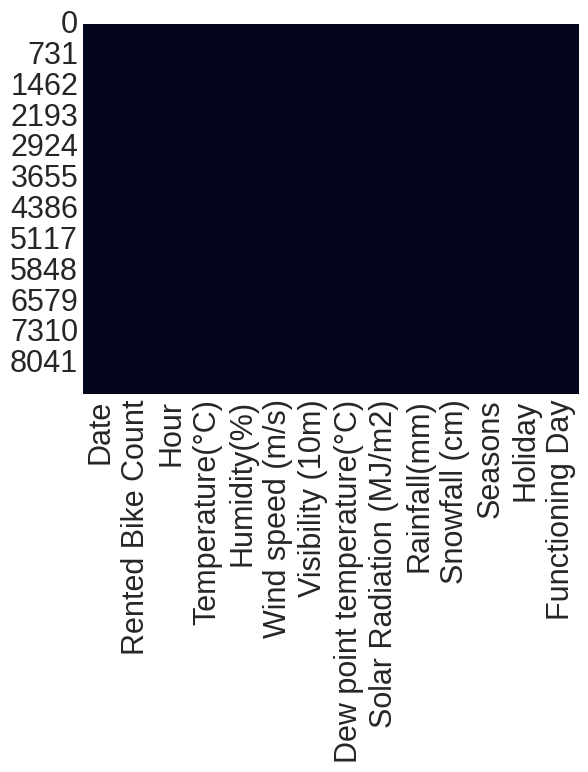

In [169]:
# Visualizing the missing values
sns.heatmap(dataset.isnull(), cbar=False);

### What did you know about your dataset?

There are 8760 observation and 14 features.
There is no null values.
Dataset has all unique values i.e., there is no duplicate which means data is free from bias as duplicates can cause problems in downstream analyses, such as biasing results or making it difficult to accurately summarize the data.
Date has object data type it should be datetime data type.



## ***2. Understanding Your Variables***

In [170]:
# Dataset Columns
# Dataset Columns
print(f'Features: {dataset.columns.to_list()}')

Features: ['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)', 'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons', 'Holiday', 'Functioning Day']


In [171]:
# Dataset Describe
dataset.describe()

,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm)
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,704.602055,11.500000,12.882922,58.226256,1.724909,1436.825799,4.073813,0.569111,0.148687,0.075068
std,644.997468,6.922582,11.944825,20.362413,1.036300,608.298712,13.060369,0.868746,1.128193,0.436746
min,0.000000,0.000000,-17.800000,0.000000,0.000000,27.000000,-30.600000,0.000000,0.000000,0.000000
25%,191.000000,5.750000,3.500000,42.000000,0.900000,940.000000,-4.700000,0.000000,0.000000,0.000000
50%,504.500000,11.500000,13.700000,57.000000,1.500000,1698.000000,5.100000,0.010000,0.000000,0.000000
75%,1065.250000,17.250000,22.500000,74.000000,2.300000,2000.000000,14.800000,0.930000,0.000000,0.000000
max,3556.000000,23.000000,39.400000,98.000000,7.400000,2000.000000,27.200000,3.520000,35.000000,8.800000


### Variables Description 

*   **Date** - Date(year-month-day)
*   **Rented_Bike_Count** - Count of bikes rented at each hour
*   **Hour** - Hour of the day(0-23)
*   **Temperature** - Temperature for the day
*   **Humidity** - Humidity Measure
*   **Windspeed** - Windspeed
*   **Visibility** - Visibility Measure
*   **Dew point temperature** - Dew Point Measure
*   **Solar radiation** - Solar Radiation Measure
*   **Rainfall** - Rainfall in mm
*   **Snowfall** - Snowfall in cm
*   **Seasons** - Season Name
*   **Holiday** - Whether Holiday or Not
*   **Functional Day** - Functional Day or Not

### Check Unique Values for each variable.

In [172]:
# Check Unique Values for each variable.
for i in dataset.columns.tolist():
  print(f"No. of unique values in {i} is {dataset[i].nunique()}.")

No. of unique values in Date is 365.
No. of unique values in Rented Bike Count is 2166.
No. of unique values in Hour is 24.
No. of unique values in Temperature(°C) is 546.
No. of unique values in Humidity(%) is 90.
No. of unique values in Wind speed (m/s) is 65.
No. of unique values in Visibility (10m) is 1789.
No. of unique values in Dew point temperature(°C) is 556.
No. of unique values in Solar Radiation (MJ/m2) is 345.
No. of unique values in Rainfall(mm) is 61.
No. of unique values in Snowfall (cm) is 51.
No. of unique values in Seasons is 4.
No. of unique values in Holiday is 2.
No. of unique values in Functioning Day is 2.


## 3. ***Data Wrangling***

### Data Wrangling Code

In [173]:
# Write your code to make your dataset analysis ready.
#converting few names for convenience
df = dataset.copy()   #keeping orginla data safe
df.rename({"Temperature(°C)": "Temperature",  
               "Functioning Day":"Functioning_Day",
                "Humidity(%)": "Humidity",  
                "Wind speed (m/s)": "Wind_speed",
                "Visibility (10m)": "Visibility",
                "Dew point temperature(°C)": "Dew_point_temperature",
                "Solar Radiation (MJ/m2)": "Solar_Radiation",
                "Snowfall (cm)": "Snowfall",
                "Rainfall(mm)": "Rainfall",
                "Rented Bike Count": "Rented_Bike_Count"},  
                axis = "columns", inplace = True) 

In [174]:
print(f'updated columns: {df.columns.to_list()}')

updated columns: ['Date', 'Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed', 'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall', 'Snowfall', 'Seasons', 'Holiday', 'Functioning_Day']


In [175]:
#changing date data type
df['Date'] = pd.to_datetime(df['Date'], infer_datetime_format=True)

In [176]:
from datetime import datetime
import calendar

In [177]:
#Extracting month from date column
df['Month'] = pd.DatetimeIndex(df['Date']).month
df['Month'] = df['Month'].apply(lambda x: calendar.month_abbr[x])

#Extracting day name from date
df['Day'] = df['Date'].dt.day_name()

#Extracting year
df['Year'] = df['Date'].dt.year

In [178]:
# dropping Date column
df.drop(columns=['Date'],inplace=True)

In [179]:
df.head()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,Month,Day,Year
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017


In [180]:
# Functioning_Day mean, median and sum
df.groupby('Functioning_Day').agg(['mean','median','sum']).T

Functioning_Day                          No           Yes
Rented_Bike_Count     mean         0.000000  7.291570e+02
                      median       0.000000  5.420000e+02
                      sum          0.000000  6.172314e+06
Hour                  mean        11.298305  1.150703e+01
                      median      11.000000  1.200000e+01
                      sum       3333.000000  9.740700e+04
Temperature           mean        16.092881  1.277106e+01
                      median      16.300000  1.350000e+01
                      sum       4747.400000  1.081070e+05
Humidity              mean        60.494915  5.814719e+01
                      median      62.000000  5.700000e+01
                      sum      17846.000000  4.922160e+05
Wind_speed            mean         1.696949  1.725883e+00
                      median       1.500000  1.500000e+00
                      sum        500.600000  1.460960e+04
Visibility            mean      1521.542373  1.433873e+03
                      median    1814.000000  1.690000e+03
                      sum     448855.000000  1.213774e+07
Dew_point_temperature mean         7.770169  3.944997e+00
                      median       7.800000  4.700000e+00
                      sum       2292.200000  3.339440e+04
Solar_Radiation       mean         0.604780  5.678677e-01
                      median       0.000000  1.000000e-02
                      sum        178.410000  4.807000e+03
Rainfall              mean         0.136271  1.491199e-01
                      median       0.000000  0.000000e+00
                      sum         40.200000  1.262300e+03
Snowfall              mean         0.000000  7.768458e-02
                      median       0.000000  0.000000e+00
                      sum          0.000000  6.576000e+02
Year                  mean      2018.000000  2.017912e+03
                      median    2018.000000  2.018000e+03
                      sum     595310.000000  1.708163e+07

In [181]:
#Weekend count
weekend = df.groupby('Day')['Rented_Bike_Count'].sum().reset_index()
off = weekend[(weekend['Day'] == 'Saturday') | (weekend['Day'] == 'Sunday')]
off

,Day,Rented_Bike_Count
2,Saturday,911475
3,Sunday,798295


In [182]:
#Working day count
workingday = df.groupby('Day')['Rented_Bike_Count'].sum().reset_index()
office = workingday[(workingday['Day'] != 'Saturday') & (workingday['Day'] != 'Sunday')]
office

,Day,Rented_Bike_Count
0,Friday,898966
1,Monday,863563
4,Thursday,928267
5,Tuesday,862877
6,Wednesday,908871


In [183]:
#checking total count of working day vs weekend
d = office['Rented_Bike_Count'].sum() > off['Rented_Bike_Count'].sum()
print(f' Is it true that total Rented_Bike_Count is more on working day? {d}')

 Is it true that total Rented_Bike_Count is more on working day? True


In [184]:
# Converting day of weeks in Two variable from Monaday to Friday in workingdays and Saturday and Sunday to Weekend
df['Week'] = df['Day'].apply(lambda x:'Weekend'  if x=='Saturday' or  x== 'Sunday' else 'Working Day')

In [185]:
#finding relation/trend of hour with rented bike count(time series analysis)
df.groupby('Hour')['Rented_Bike_Count'].sum().reset_index().sort_values('Rented_Bike_Count', ascending = False)

,Hour,Rented_Bike_Count
18,18,548568
19,19,436229
17,17,415556
20,20,390172
21,21,376479
8,8,370731
16,16,339677
22,22,336821
15,15,302653
14,14,276971


In [186]:
#converting hour into morning 0-12 afternoon 12-6 and night after 6pm or 18
df['Time_Period'] = df['Hour'].apply(lambda x:'Morning'  if x < 12 else 'Afternoon' if (x >=12) and (x < 18) else 'Night')

In [187]:
#checking bike demand based on time period of the day
df.groupby('Time_Period')['Rented_Bike_Count'].agg(['sum','mean','count']).reset_index().rename(
    columns = {'sum':'Rented_Bike_Count','mean':'Avg_Rented_Bike_Count','count':'Count'}).sort_values(
    'Rented_Bike_Count', ascending = False)

,Time_Period,Rented_Bike_Count,Avg_Rented_Bike_Count,Count
2,Night,2333230,1065.401826,2190
1,Morning,1981296,452.350685,4380
0,Afternoon,1857788,848.305023,2190


In [188]:
#finding effect of visibility on rented bike count
df_visibility = df.groupby('Visibility')['Rented_Bike_Count'].agg(['sum','mean','count']).reset_index().rename(
    columns = {'sum':'Rented_Bike_Count','mean':'Avg_Rented_Bike_Count','count':'Count'}).sort_values(
    'Rented_Bike_Count', ascending = False)
df_visibility[:10]

,Visibility,Rented_Bike_Count,Avg_Rented_Bike_Count,Count
1788,2000,1836690,818.124722,2245
1783,1995,26276,772.823529,34
1777,1989,22383,799.392857,28
1775,1987,21544,936.695652,23
1780,1992,21405,823.269231,26
1773,1985,19848,708.857143,28
1774,1986,19835,1043.947368,19
1784,1996,19547,723.962963,27
1786,1998,19518,780.720000,25
1778,1990,19495,847.608696,23


In [189]:
#finding effect of humidity on rented bike count
df_humidity = df.groupby('Humidity')['Rented_Bike_Count'].agg(['sum','mean','count']).reset_index().rename(
    columns = {'sum':'Rented_Bike_Count','mean':'Avg_Rented_Bike_Count','count':'Count'}).sort_values(
    'Rented_Bike_Count', ascending = False)
df_humidity[:10]

,Humidity,Rented_Bike_Count,Avg_Rented_Bike_Count,Count
34,43,141773,864.469512,164
44,53,140725,813.439306,173
38,47,138105,885.288462,156
47,56,134711,858.031847,157
42,51,131966,851.393548,155
43,52,130054,867.026667,150
46,55,129240,891.310345,145
35,44,126969,857.898649,148
36,45,126234,888.971831,142
45,54,123762,819.615894,151


In [190]:
df.head()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,Month,Day,Year,Week,Time_Period
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning


In [191]:
#finding effect of seasons on rented bike count
df_seasons = df.groupby('Seasons')['Rented_Bike_Count'].agg(['sum','mean','count']).reset_index().rename(
    columns = {'sum':'Rented_Bike_Count','mean':'Avg_Rented_Bike_Count','count':'Count'}).sort_values(
    'Rented_Bike_Count', ascending = False)
df_seasons[:10]

,Seasons,Rented_Bike_Count,Avg_Rented_Bike_Count,Count
2,Summer,2283234,1034.073370,2208
0,Autumn,1790002,819.597985,2184
1,Spring,1611909,730.031250,2208
3,Winter,487169,225.541204,2160


### What all manipulations have you done and insights you found?

In order to start the analysis, I first started by making data more consistent i.e., I first changed column name to more readable format. Later I converted incorrect data type of date feature into datetime data type and then extracted month, year and day from date and then deleted the date features. Then I tried to find how bike demand is affected based on other features like visibility and humidity. I have also created two different columns, one by dividing day of week into working and weekend to check how bike demand was affected and then based on hour i divided enitre column in different time period to understand its affect.

▶ Insights from analysis:
*  People tends to use bike when company is functional i.e., for non functioning day bike rented was zero.
*  Demand for bike is affected if there is holiday.
*  Visibility shows linear relation with bike demand.
*  People prefer bike when there is moderate humidity 30-55.
*  With change in seasons, demand for bike also changes. Maximum when summer and minium when winter.

Visualization will show more effect with results.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

In [192]:
#storing numerical feature in separate variable
#Return a subset of the DataFrame’s columns based on the column dtypes
num_feature = df.select_dtypes(exclude='object')    
print(f'Numerical feature : {num_feature.columns.to_list()}')

Numerical feature : ['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed', 'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall', 'Snowfall', 'Year']


In [193]:
#storing categorial feature in separate variable
#Pandas isin() method is used to filter data frames using boolean value true of false
#Tilde sign (~)works as a negation operator i.e reverse true to false and false to true
cat_feature = df.loc[:,  ~df.columns.isin(num_feature.columns.to_list())] 
print(f'Categorical feature : {cat_feature.columns.to_list()}')    

Categorical feature : ['Seasons', 'Holiday', 'Functioning_Day', 'Month', 'Day', 'Week', 'Time_Period']


In [194]:
#checking outliers using box plot
def box_plot(df,feature):
  for i,col in enumerate(feature.columns) :
    plt.figure(figsize = (20,25))
    if df[col].dtypes == 'object':
      plt.subplot(4,2,i+1);
      sns.boxplot(x=df[col],y=df["Rented_Bike_Count"]);
      plt.xticks(fontsize = 18, rotation = 90);
    else:
      plt.subplot(6,2,i+1);
      sns.boxplot(df[col]);
    plt.tight_layout();

###Univariate analysis

In [195]:
from scipy.stats import norm

In [196]:
#analysing numerical value using density plot with mean and median
#Rose-Red Color indicate mean of data
#Cyan indicate median of data
def density_plot(dfr,num_feature):
  graph = plt.figure(figsize = (20,30))
  for i,col in enumerate(num_feature) :
    sns.set_style("ticks")
    sns.set_context("poster");
    plt.subplot(6,2,i+1);
    sns.distplot(dfr[col], color = '#055E85', fit = norm);
    feature = dfr[col]
    plt.axvline(feature.mean(), color='#ff033e', linestyle='dashed', linewidth=3,label= 'mean');  #red
    plt.axvline(feature.median(), color='#A020F0', linestyle='dashed', linewidth=3,label='median'); #cyan
    plt.title(f'{col.title()}');
    plt.tight_layout();

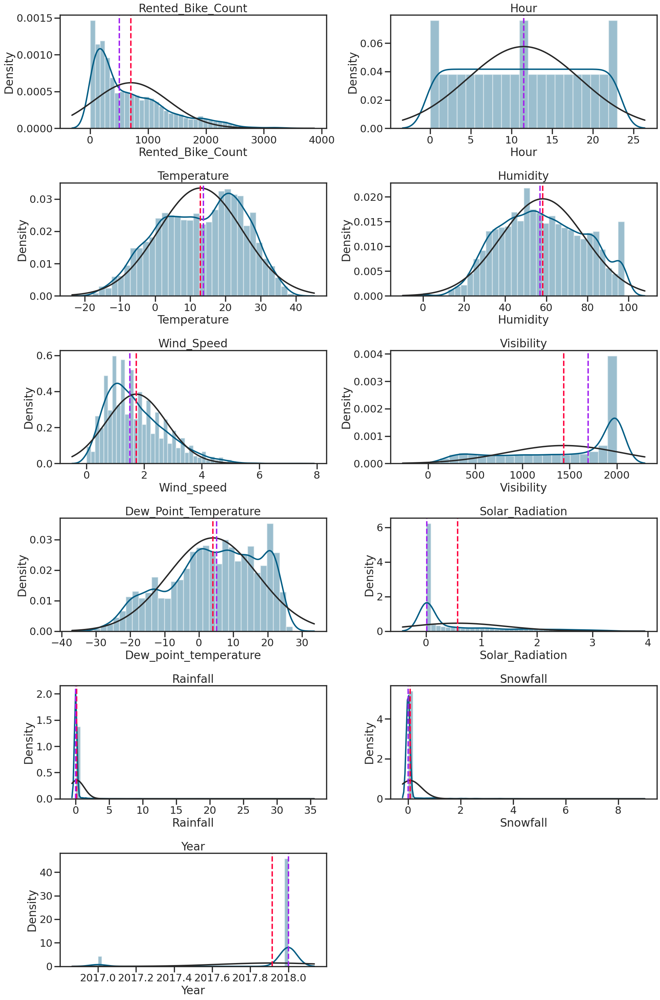

In [197]:
#graph to analyse distribution of different numerical features
density_plot(df,num_feature)

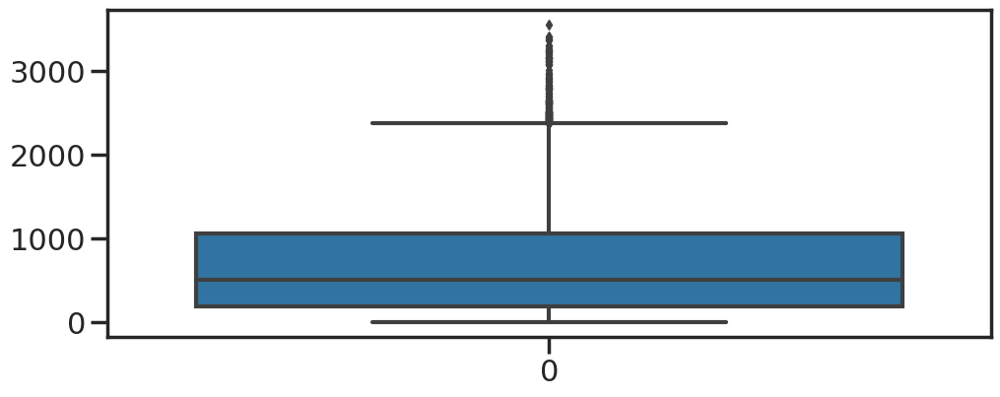

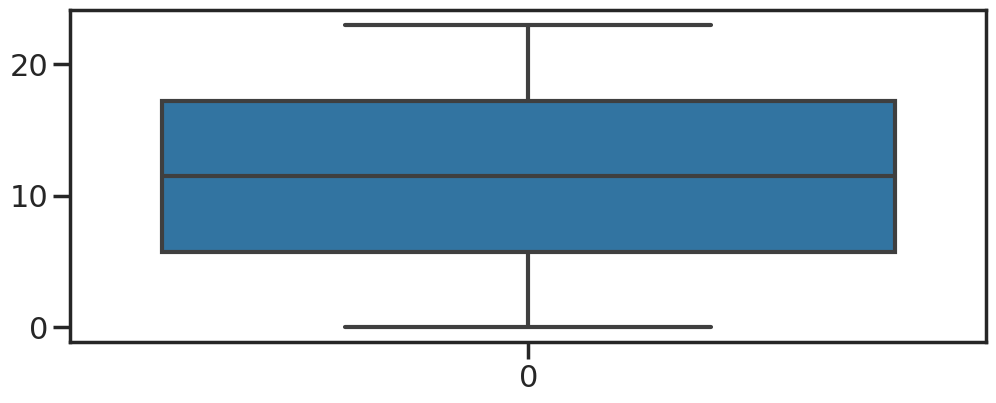

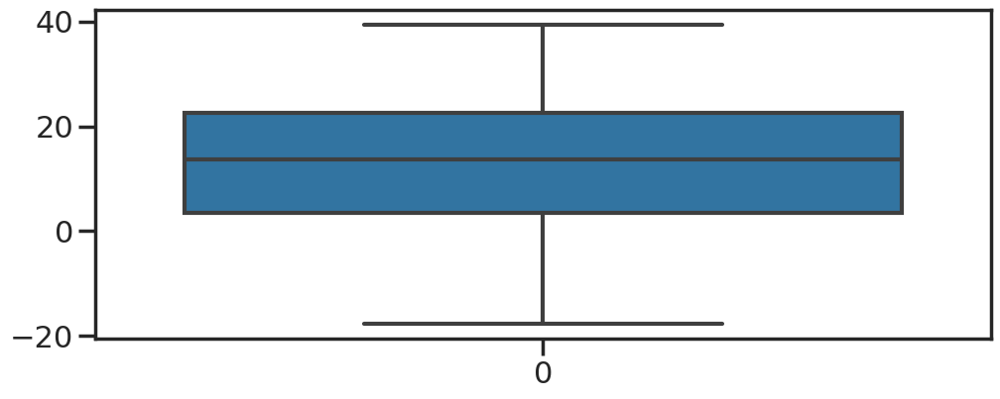

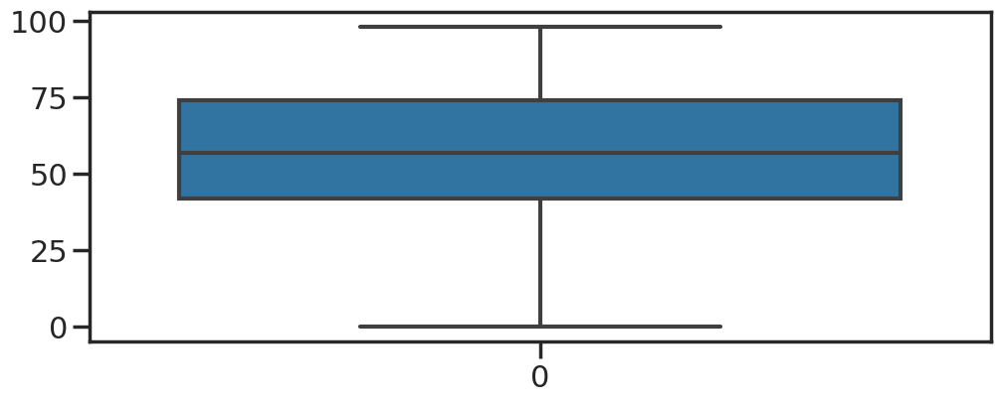

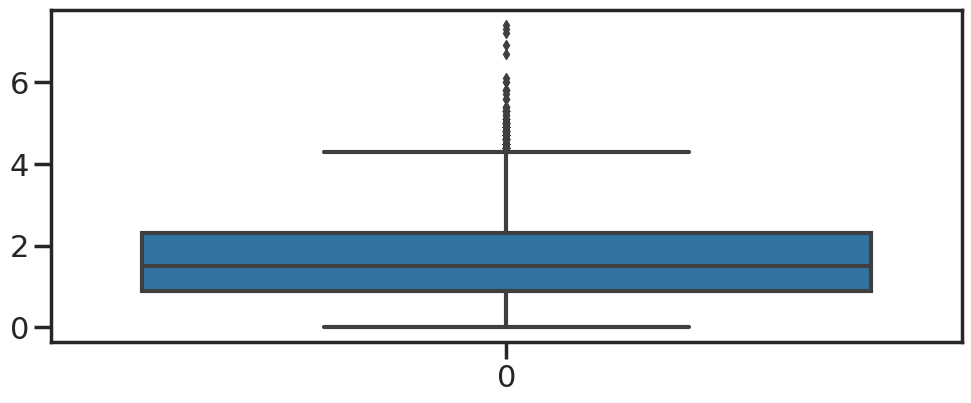

...

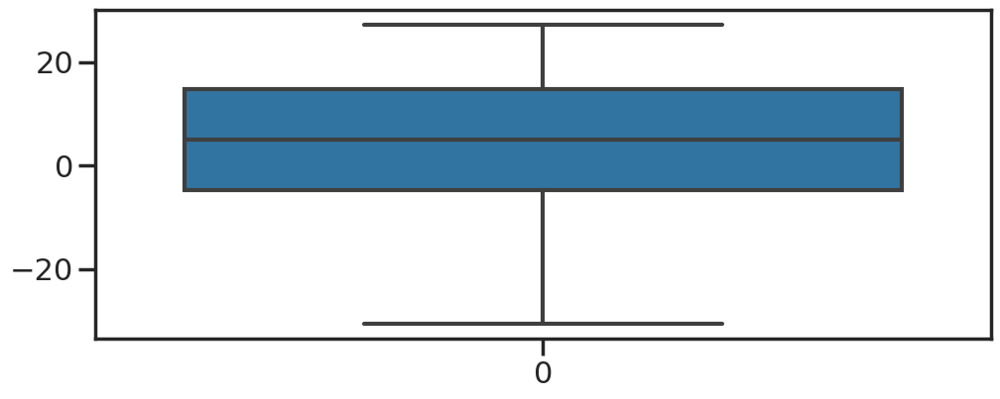

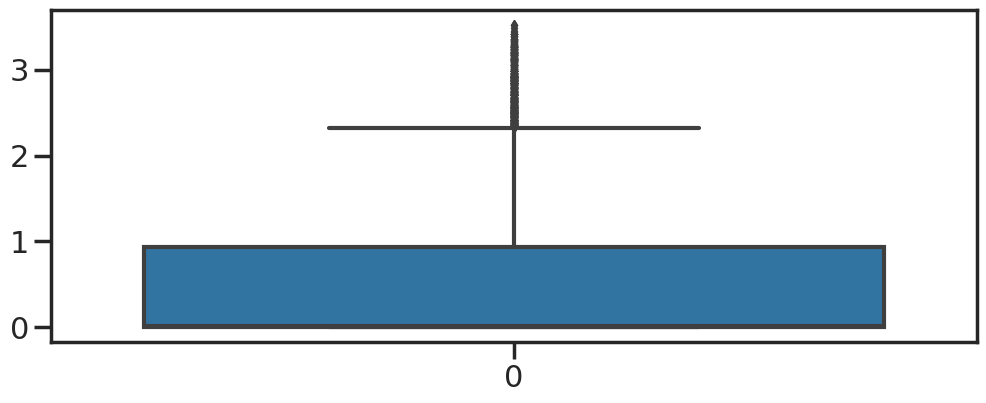

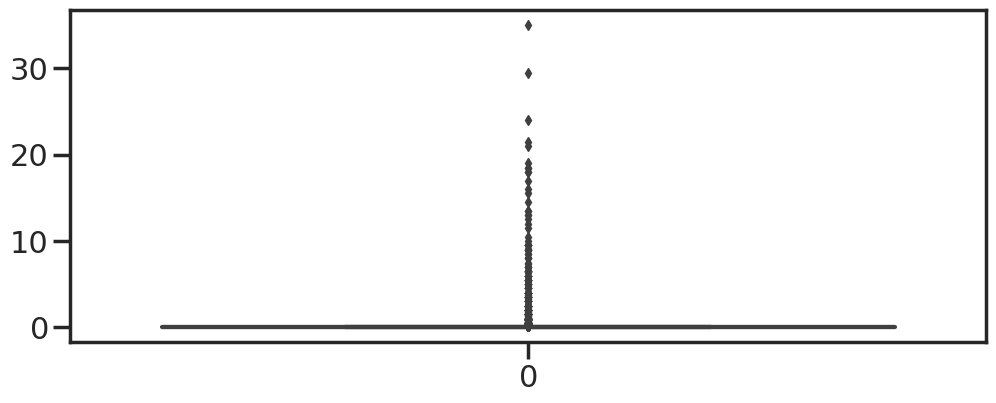

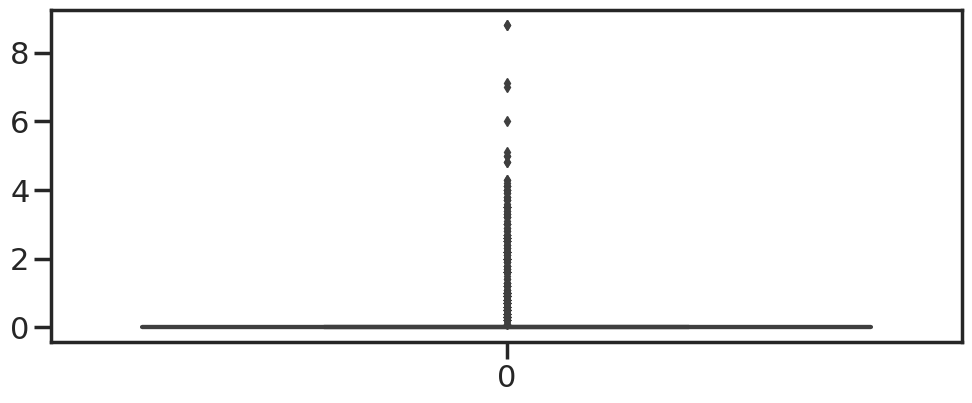

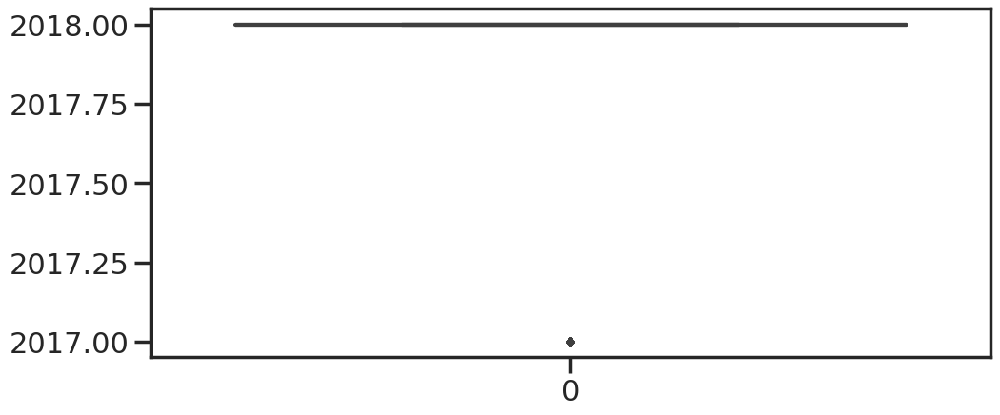

In [198]:
#using box plot function checking outliers in numerical features
box_plot(df, num_feature)

#### Chart - 1 Understanding the distribution

##### 1. Why did you pick the specific chart?

In order to understand the distribution for each feature, I plotted distplot along with its mean and median. Distplot is shows both histogram and kde plot and is best suited for continous data.

##### 2. What is/are the insight(s) found from the chart?


Right/Positive Skewed Distribution: Mode < Median < Mean: Rented_Bike_Count, Wind_speed, Solar Radiation

No Skew: Mean = Median = Mode : Hour, Temperature, Humidity,Rainfall,Snowfall

Left/Negative Skewed Distribution: Mean < Median < Mode: visibility

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

In this context it can not define any business impact. It's done just to see the distribution of the column data over the dataset.

#### Chart - 2- Visualization of Outliers

##### 1. Why did you pick the specific chart?

Box plot help in Visualization of outliers, distribution of median.

##### 2. What is/are the insight(s) found from the chart?

* In rented bike count feature there are few points accumulated above maximum range. 
* Feature like snowfall and rainfall show sparse data as there are more number of values which is zero i.e., upto 75 quartile.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.


Box plot alone can not provide any business impact, plotted only to visulize distribution and understanding of anamolies.

###Bivariate Analysis

> Indented block



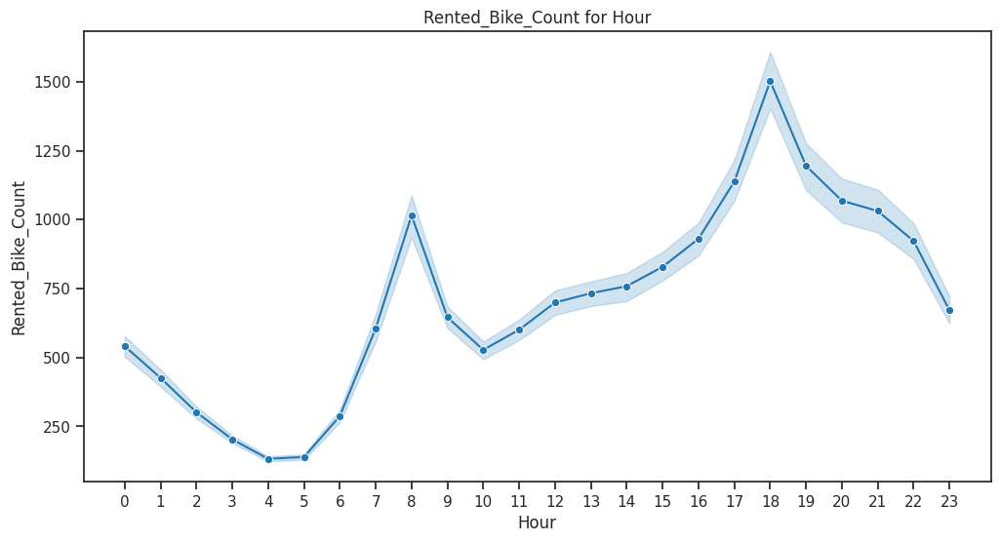

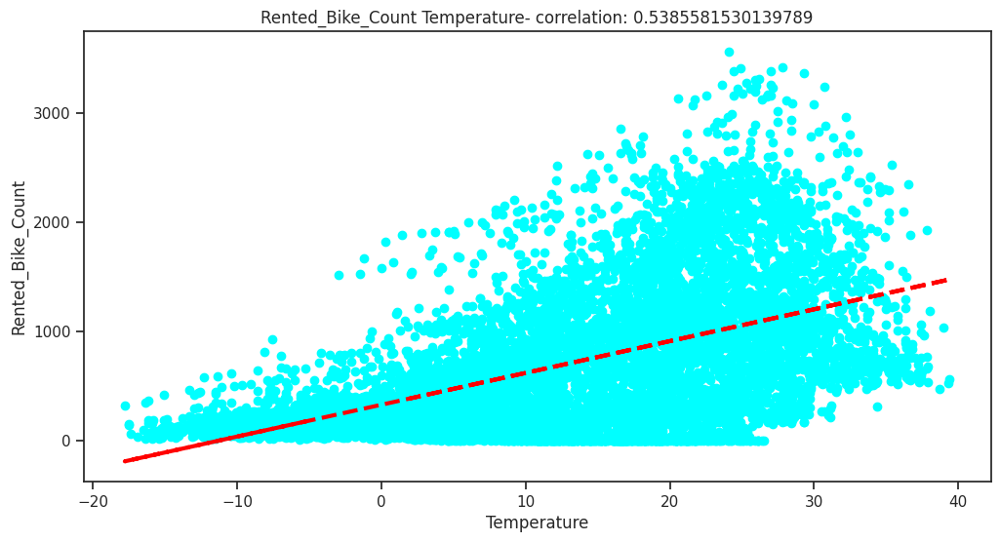

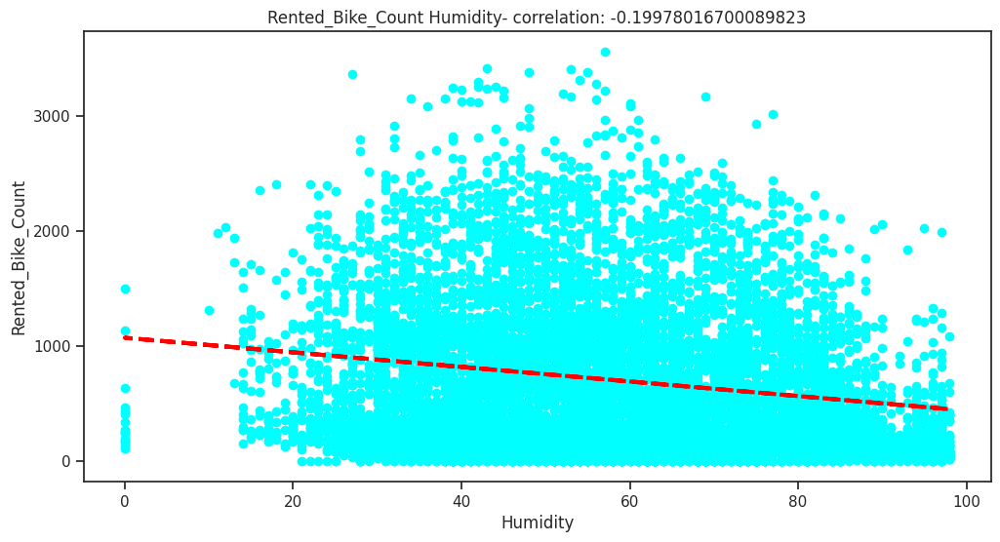

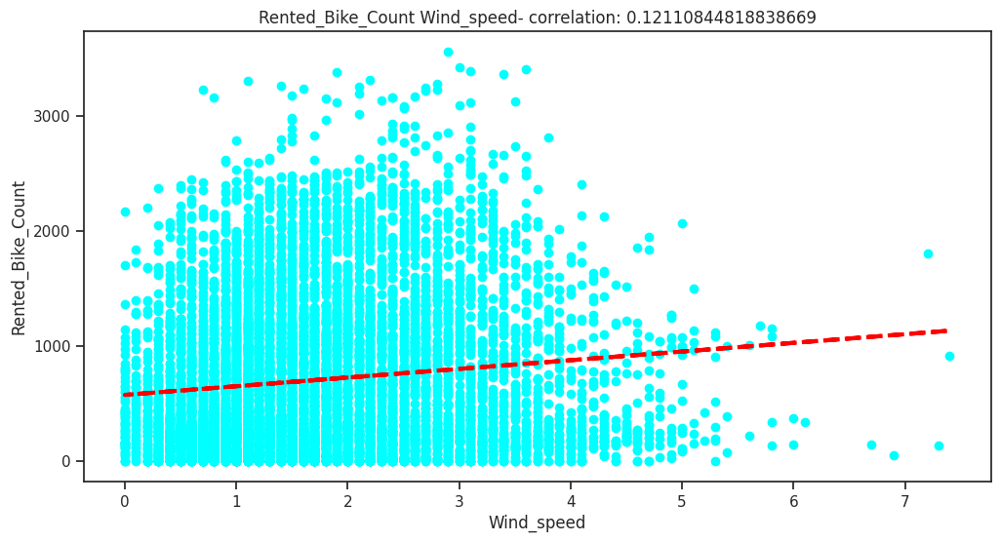

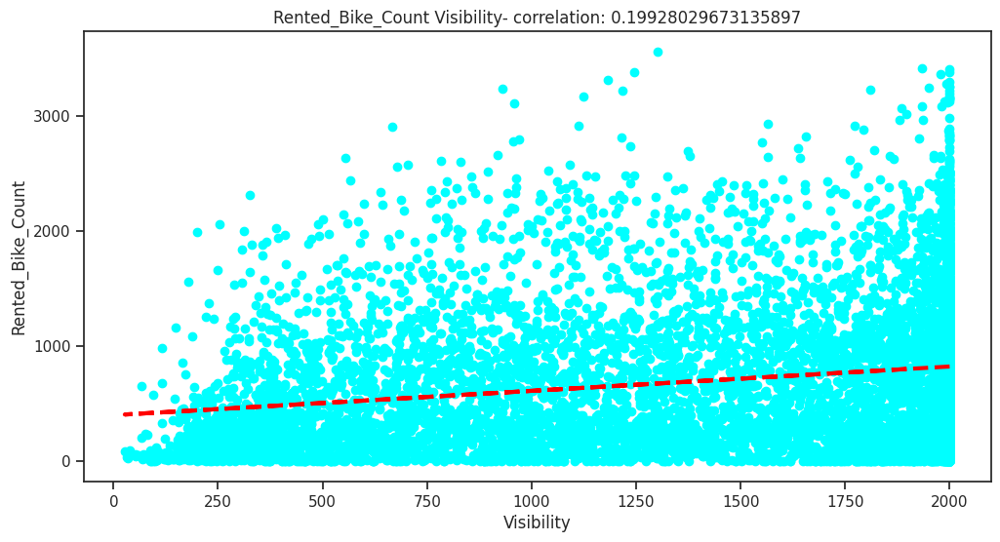

...

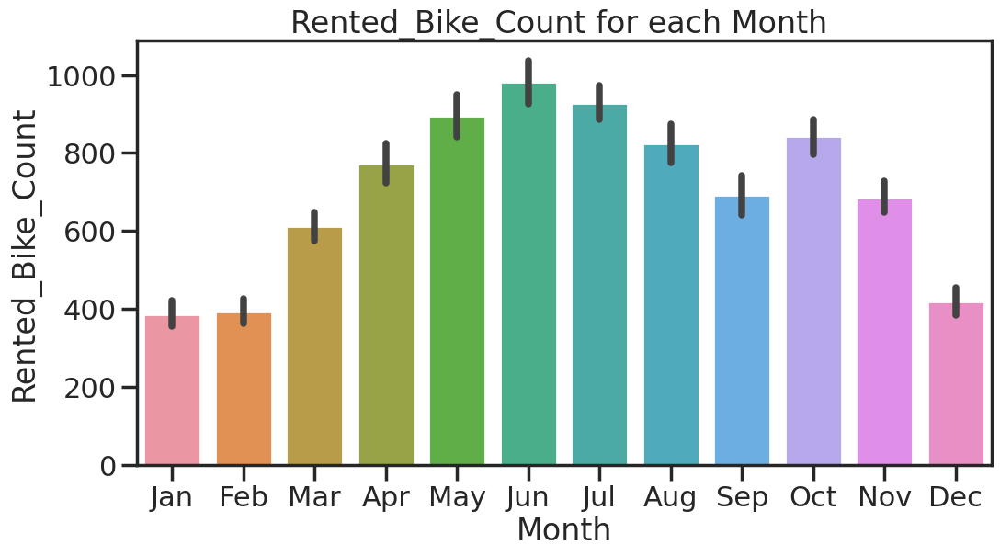

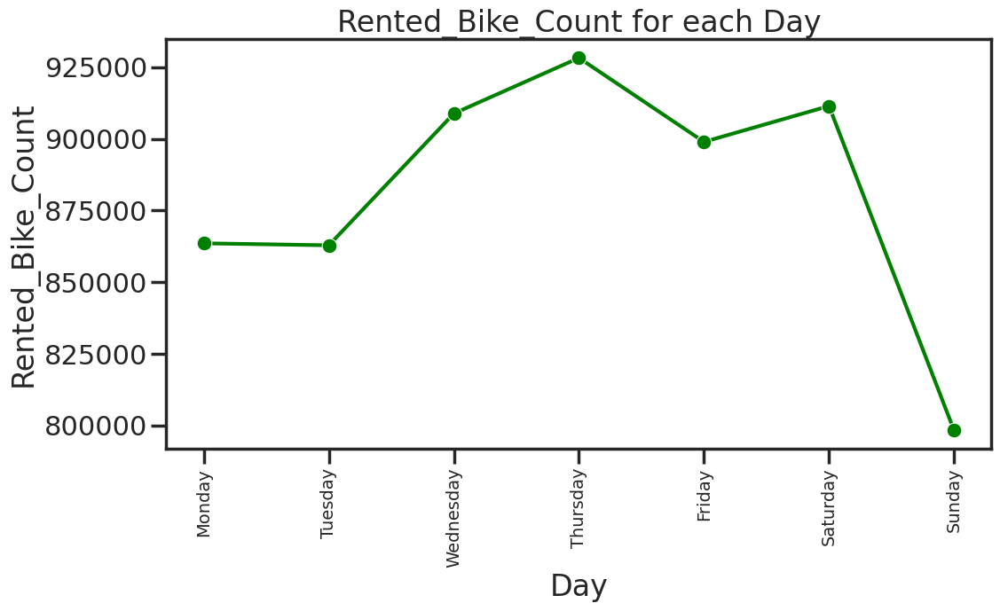

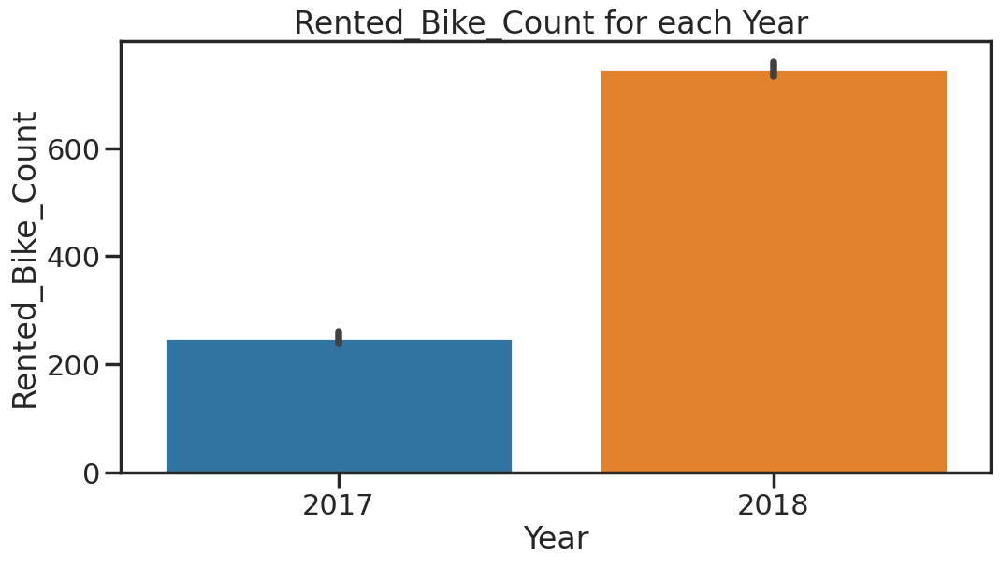

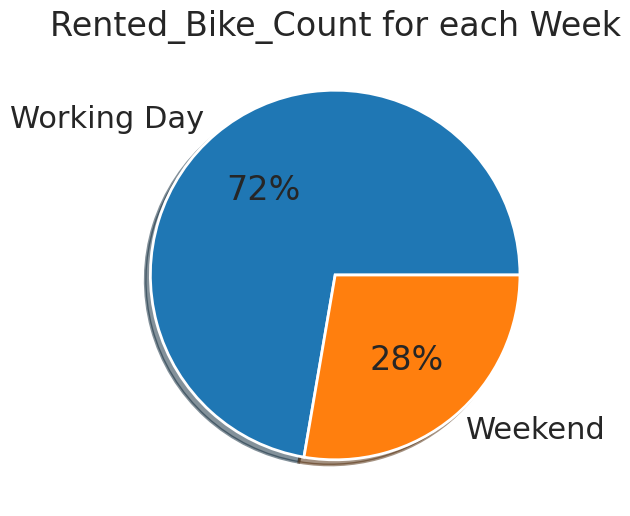

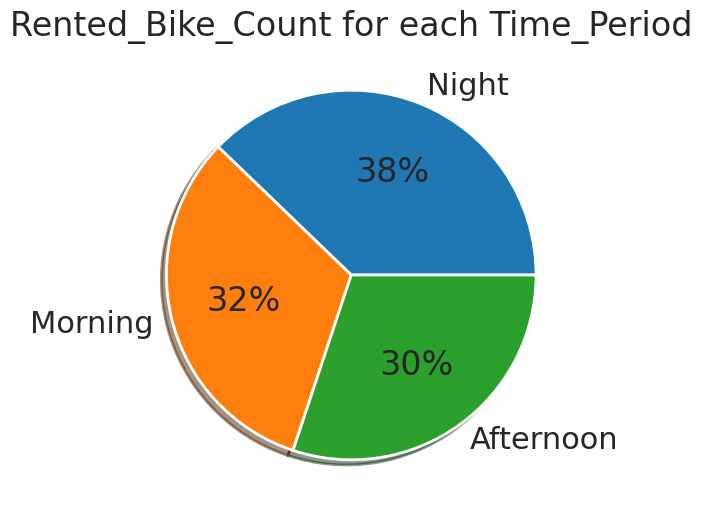

In [199]:
#  visualization code
#comparing different feature with bike count 
for i in df.columns:
  if i == 'Rented_Bike_Count':
    pass
  #barplot
  elif i in ['Seasons','Month','Year']:
    sns.set_context('poster');
    plt.figure(figsize=(12,6));
    chart = sns.barplot(x=df[i], y=df["Rented_Bike_Count"]);
    plt.title(f"Rented_Bike_Count for each {i} ");
    print('='*120);
  #pie chart
  elif i in ['Holiday','Functioning_Day','Week','Time_Period']:
    grp = df.groupby([i], as_index = False)['Rented_Bike_Count'].sum().sort_values('Rented_Bike_Count',
                                                                                    ascending = False)
    sns.set_context('poster');
    plt.figure(figsize=(12,6));
    palette_color = sns.color_palette('bright');
    chart = plt.pie(grp['Rented_Bike_Count'], labels= grp[i],shadow= True,autopct='%.0f%%');
    plt.title(f"Rented_Bike_Count for each {i}");
    print('='*120);
  #lineplot
  elif i == 'Day':
    workingdays = {'Day':['Monday','Tuesday','Wednesday','Thursday','Friday',	'Saturday',	'Sunday']}
    workingday = pd.DataFrame(workingdays)
    grp = df.groupby([i], as_index = False)['Rented_Bike_Count'].sum().sort_values('Rented_Bike_Count',
                                                                                    ascending = False)
    new_df = workingday.merge(grp)
    sns.set_context('poster');
    plt.figure(figsize=(12,6));
    chart = sns.lineplot(data= new_df, x=i,y= 'Rented_Bike_Count', marker= 'o', color = 'green');
    plt.xticks(fontsize = 14, rotation = 90);
    plt.title(f"Rented_Bike_Count for each {i}");
    print('='*120);
  #lineplot for hour
  elif i == 'Hour' :
    sns.set_context('notebook');
    plt.figure(figsize=(12,6));
    chart = sns.lineplot(x=df[i], y=df["Rented_Bike_Count"],marker= 'o');
    plt.xticks(range(24))
    plt.title(f"Rented_Bike_Count for {i}");
  #scatterplot
  else:
    sns.set_context('notebook');
    fig = plt.figure(figsize=(12, 6));
    ax = fig.gca();
    feature = df[i]
    label = df['Rented_Bike_Count']
    correlation = feature.corr(label)
    chart = plt.scatter(x=feature, y=label,color='cyan');
    plt.xlabel(i);
    plt.ylabel('Rented_Bike_Count');
    ax.set_title('Rented_Bike_Count ' + i + '- correlation: ' + str(correlation));
    z = np.polyfit(df[i], df['Rented_Bike_Count'], 1);
    y_hat = np.poly1d(z)(df[i]);

    plt.plot(df[i], y_hat, "r--", lw=3);
    print('='*120)

plt.show()


#### Chart - 3 Effect of Hour on Rented Bike Count (Lineplot and Pie chart)


##### 1. Why did you pick the specific chart?

Linetplot - I choose lineplot to plot hour and rented bike count for each hour because it helps in plotting for continous and vizualize the possible trend. Here rented bike count in the plot is represented by mean value and the shaded around the line shows the confidence interval which shows the uncertainity in the mean estimate i.e., it helps to visualize the range of values within which the true mean is likely to fall, based on the sample data. (* Note : The width of the confidence interval is determined by the sample size, the variance of the data, and the desired level of confidence.For example, if the sample size is large and the data are very consistent (i.e. low variance), then the confidence interval will be narrow, indicating that the mean estimate is very precise. On the other hand, if the sample size is small or the data are highly variable, then the confidence interval will be wider, indicating that the mean estimate is less precise.)

Pie chart - In order to show different percentage of rented bike count around different time period of the day - morning (0-12), afternoon(12-18) and night(18-0). Pie chart help in better understanding of different proportion of data.

##### 2. What is/are the insight(s) found from the chart?

Lineplot for hour and rented bike count shows that:
* Demand for bike is more during 8-10 in morning and 18-20 in night.
* Bike demand from midnight start decreasing till 4 in morning then gradually increase and comes at peak in night.

Pie chart for total rented bike count and time period shows:
* 38% of demand was in night, 32% in morning and 30% in afternoon.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Are there any insights that lead to negative growth? Justify with specific reason.

Hour of the day definetly plays important role for any business. It help in understanding the behaviour of customer engagement and how company should be prepared to deal with the situation. In this case since the demand is more is more in night and morning specifically to 8-9 and 18-20, stable supply to meet demand during those will increase revenue whereas shortage will cause negative growth.

#### Chart - 4  Effect of different day of week (Lineplot and Pie chart)

##### 1. Why did you pick the specific chart?

Lineplot - Lineplot helps in time series analysis to learn the trend.

Pie chart - As the day of the week was divided into working (Monday-Friday) and weekend (Sat- Sun), pie chart help in understanding the percentage total rented bike count for the two category.

##### 2. What is/are the insight(s) found from the chart?

Lineplot for Day and Total Rented bike count shows:
* There is a increase in demand from mondat to thrusday then it lowers on friday, later increases on satuerday and shows least demand in sunday.

Pie Chart - It shows that 72% bike demand is during working day and 28% bike demand is on weekend.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, based on the activity it is necessary to maintain stable supply for most demanding day as it will directly affect revenue in case of shortage. Based on the demand if company will not fulfill criteria it will not only have negative brand effect but also low retention in customers.

#### Chart - 5 Effect of Month, Season and Year on Rented Bike Count (Barplot)

##### 1. Why did you pick the specific chart?

I used this chart because it helps to compare between different categories.

##### 2. What is/are the insight(s) found from the chart?

Month and rented bike count shows:
* Bike count increase from January till June then there is a small decrease and again rise in October and gradually decrease till December.

Season and rented bike count shows:
* Demand for bike count is more in summer and lower in winters and with season graph it is also justified.

Year and rented bike count:
* There is a increase in demand.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, based on the above insight it will help in customer retention and growth.

Since data available is only for two year, therefore year itself can not have any much of impact on business, however it shows increase which is a sign of market capture for a new business.

#### Chart - 6 Effect on Functioning day and Holiday (Pie Chart)

##### 1. Why did you pick the specific chart?

Both functioning day and holiday represnt categorial data with binary answers i.e., yes or no and that's why used the pie chart to understand different allocation of each answer.

##### 2. What is/are the insight(s) found from the chart?

Pie chart of Functioning day shows:
* There are 0 rented bike count on non funcitoning day which means to accomplish demand company should focus more on functioning day.

Pie chart of Holiday shows:
* 97% of bikes are rented when there is no holiday and 3% on holiday.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Since 100% of the profit are generated on functioning day, company should focus more on increasing functioning hours or day as it will directly generate more traffic for business.

Similarly, holiday always results in reduced foot traffic which can also be seen in the graph how only 3% of the demand is generated on holiday, in order to maintain the profit ratio on holiday slight increase in price could balance profit ratio. Since we do not know exact price point from dataset, it will hard to say what amount to increase and how price affect the demand, will increase in price can lead to negative growth.

#### Chart - 7 Effect of Environment Factors on Rented Bike count (Scatter plot with correlation)

##### 1. Why did you pick the specific chart?

Scatterplot is best when we need to vizualize relationship between two variable.

##### 2. What is/are the insight(s) found from the chart?

* Snowfall and rainfall show negative linear relation with rented bike count.
* Bike demand is more when there is low solar radiaiton.
* When there is high visibility, demand is more.
* Dew point and humidity shows increase in demand when they are present in moderate amount.
* Less windspeed is prefered for maximum demand.
* Average temperature of 20-35 show maximum demand.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.


Environmental factors play an important role as the business solely depends upon them for its operations and success.However we can not control these natural environment, therefore based on the demand and how it alter it, company should be alet with wether forecasting to arrange suitable demand based on daily weather.

These natural environment factors can significantly impact the demand for bike rentals by making it less appealing or unsafe to ride a bike.

#### Chart - 8 Box plot for Categorial Feature with respect to Bike Demand

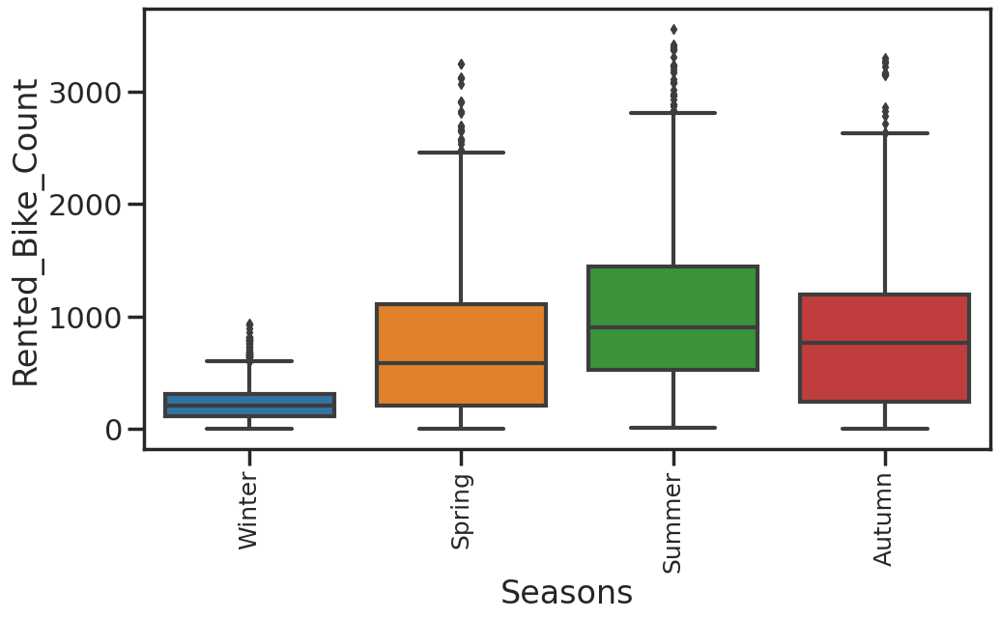

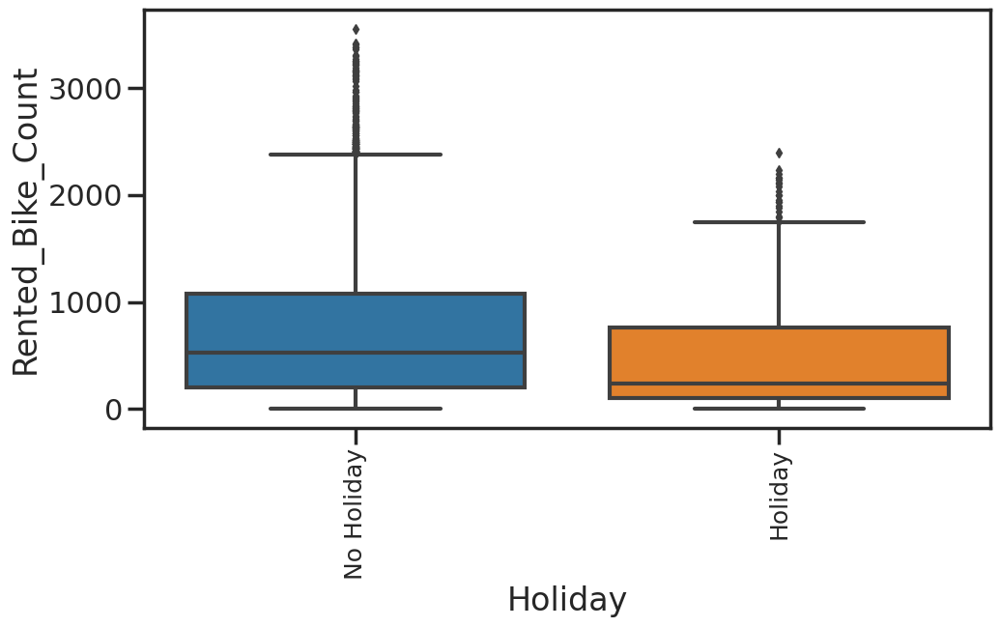

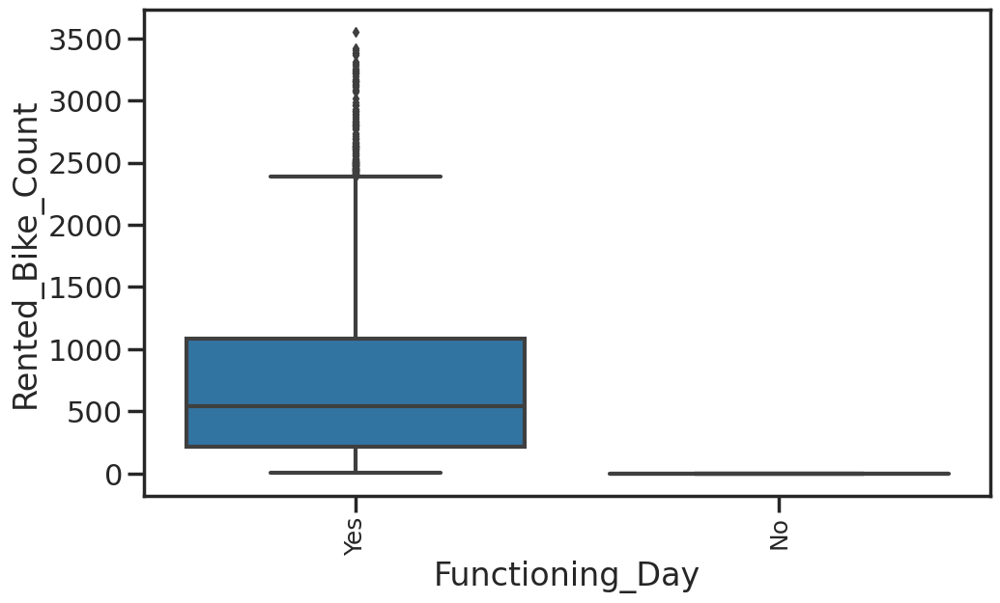

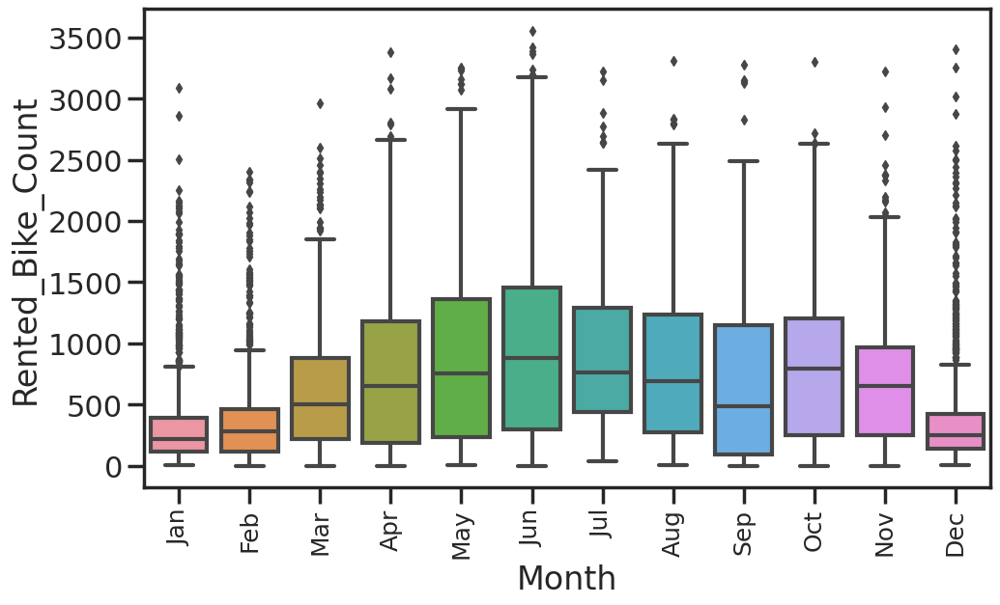

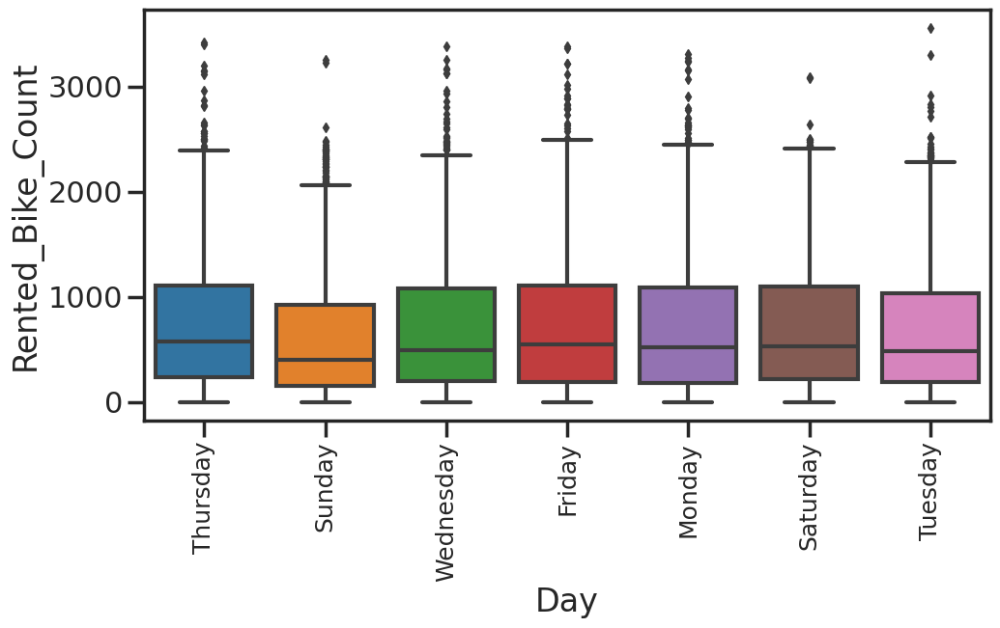

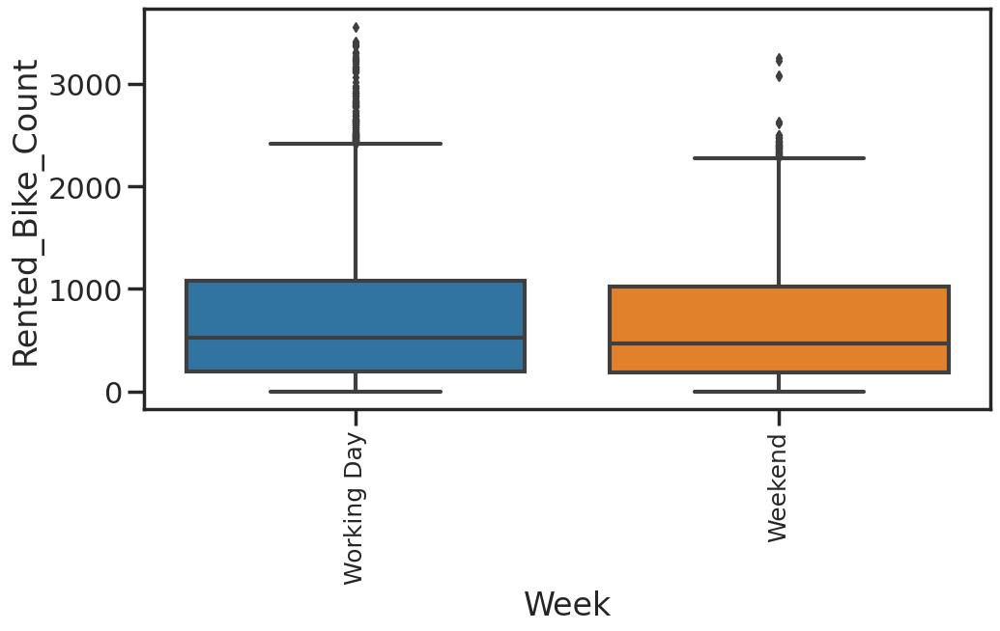

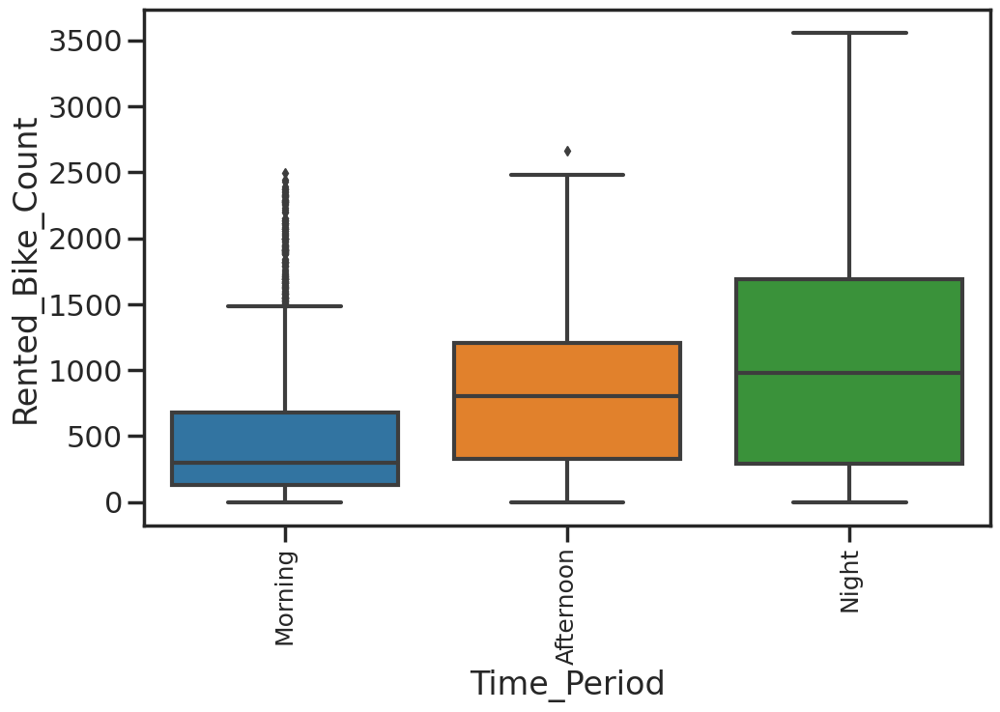

In [200]:
# Chart - 8 visualization code
box_plot(df,cat_feature)

##### 1. Why did you pick the specific chart?


Box plots are helpful in learning about outliers and to determine where the majority of the points land at a glance.

##### 2. What is/are the insight(s) found from the chart?

Few rented bike count are above the maximum point.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Box plot can not show impact on business, used only to learn about distribution.

###Multivariate

#### Chart - 9 Analyzing how rented bike count if affected every Hour with respect to other features.


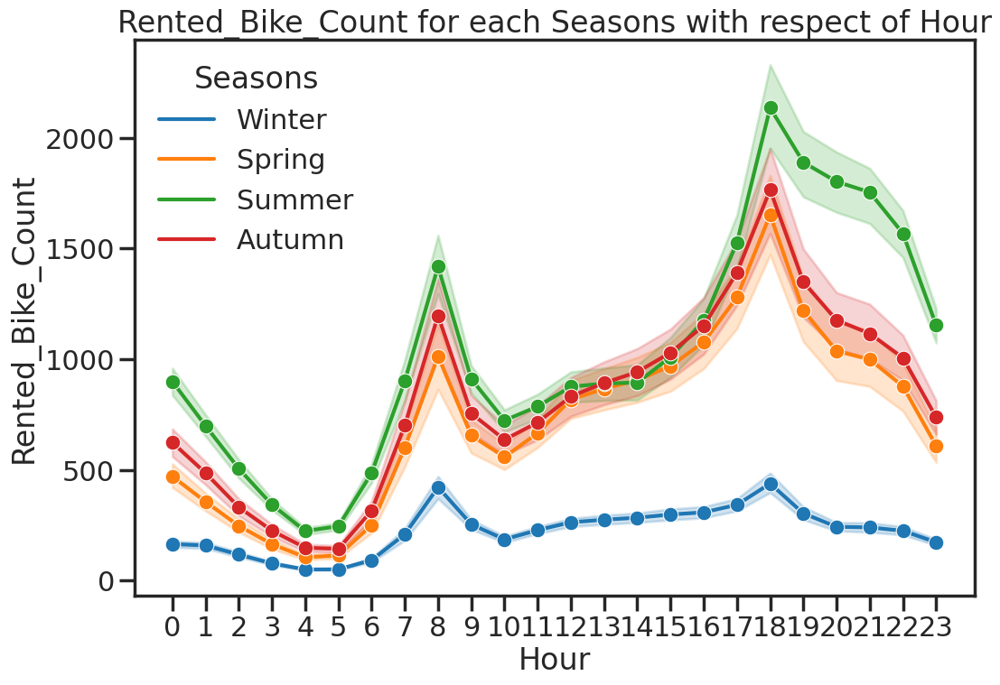

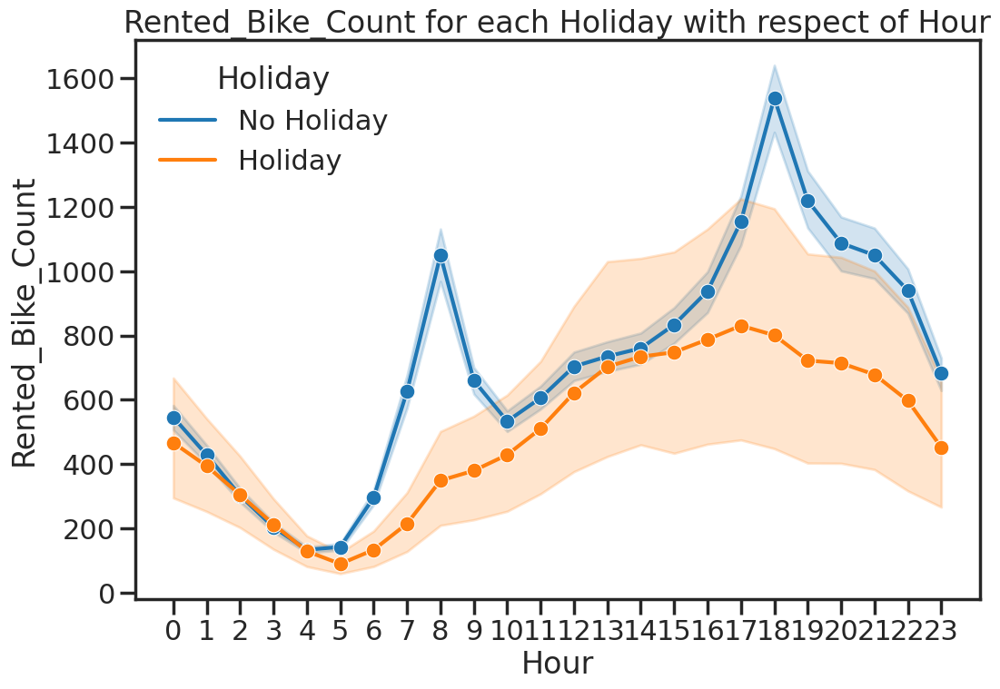

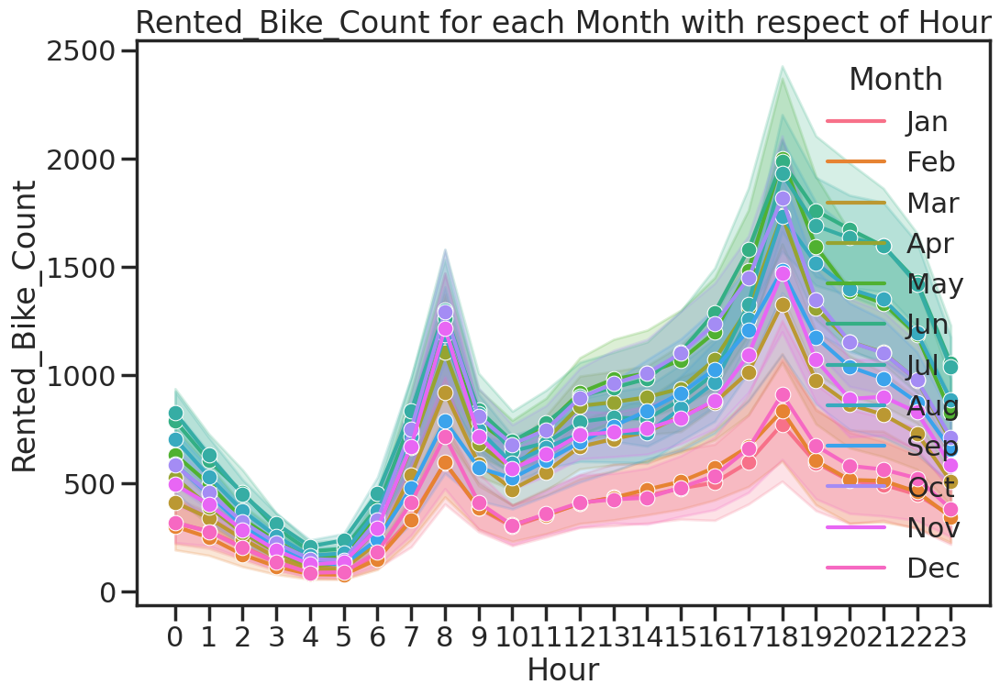

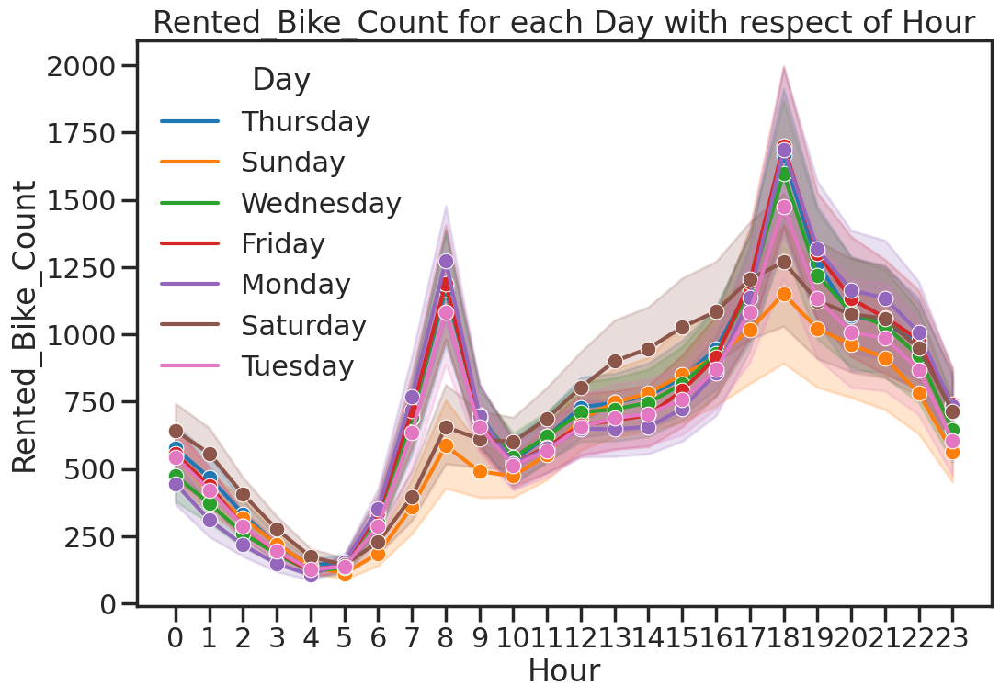

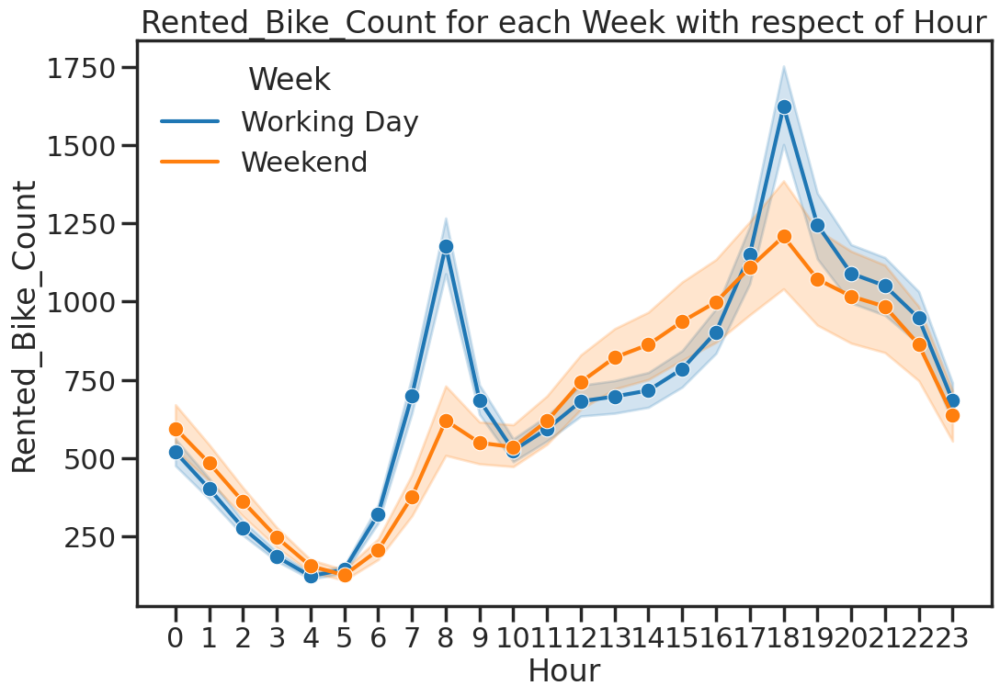

In [201]:
# Chart - 9 visualization code
#analysing hour with bike demand with respect to different third value

for i in cat_feature:
  if i in ['Hour','Time_Period','Functioning_Day']:
    pass
  else:
    plt.figure(figsize=(12,8))
    fig = sns.lineplot(x=df["Hour"],y=df['Rented_Bike_Count'],hue=df[i], marker ='o');
    plt.xticks(range(24));
    plt.title(f"Rented_Bike_Count for each {i} with respect of Hour");
  plt.show();

##### 1. Why did you pick the specific chart?

I pick lineplot for comparing different feature based on hue because i was comparing different features based on time.

##### 2. What is/are the insight(s) found from the chart?

Shows maximum demand around 8-9 and 18-20 irrespect of other features.

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

It is important to maintain demand based on the time to generate stable profit.

Based on time period if unable to maintain demand, it will create a chance of new competition.

#### Chart - 10 -  Correlation Heatmap

<Axes: >

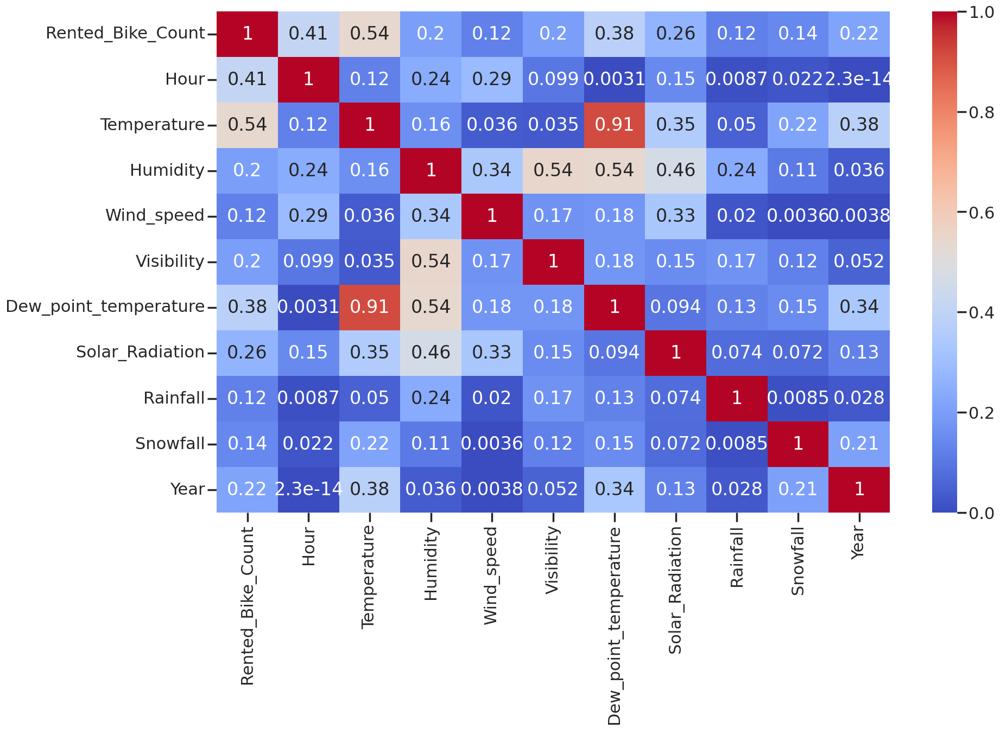

In [202]:
# Chart - 10 visualization code
 ## Correlation
plt.figure(figsize=(20,12))
correlation = df.corr()
sns.heatmap(abs(correlation), annot=True, cmap='coolwarm')

##### 1. Why did you pick the specific chart?

A correlation matrix is a table showing correlation coefficients between variables. Each cell in the table shows the correlation between two variables. A correlation matrix is used to summarize data, as an input into a more advanced analysis, and as a diagnostic for advanced analyses. The range of correlation is [-1,1].

Thus to know the correlation between all the variables along with the correlation coeficients, i used correlation heatmap.

##### 2. What is/are the insight(s) found from the chart?

* Features like **Temperature(°C)** and **Dew point temperature(°C)** show **correlation** of **0.91**
> ⚡Note: If two variable or features show relationship either in same or opposite direction, then these variables thus show correlation between them.

* **Hour** and **temperature** show positive correlation.

In [203]:
df.head()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,Month,Day,Year,Week,Time_Period
0,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning
1,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning
2,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning
3,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning
4,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning


#### Chart - 12 - Pair Plot 

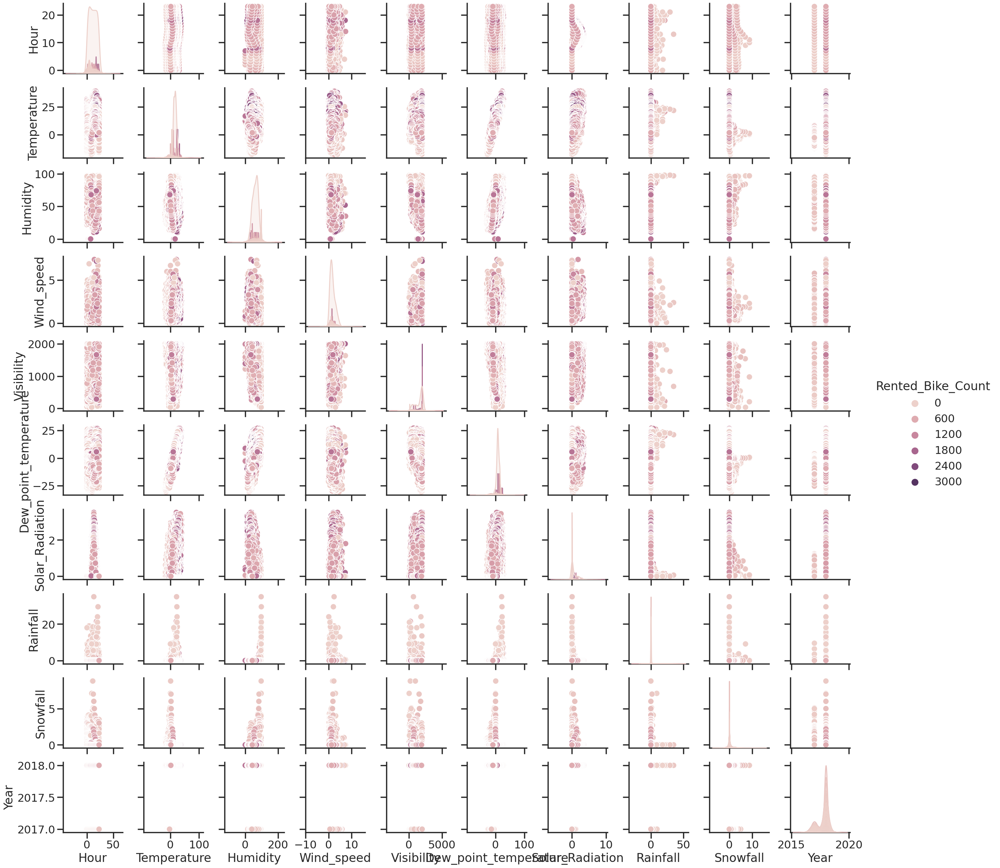

In [204]:
# Pair Plot visualization code
sns.pairplot(df ,hue="Rented_Bike_Count")
plt.show()

##### 1. Why did you pick the specific chart?

Pair plot is used to understand the best set of features to explain a relationship between two variables or to form the most separated clusters. It also helps to form some simple classification models by drawing some simple lines or make linear separation in our data-set.

Thus, I used pair plot to analyse the patterns of data and realationship between the features. It's exactly same as the correlation map but here you will get the graphical representation.

##### 2. What is/are the insight(s) found from the chart?

The above chart depicts the correlation of various labels with respect to rented bike counts around.

## ***5. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

Rented_Bike_Count        0
Hour                     0
Temperature              0
Humidity                 0
Wind_speed               0
Visibility               0
Dew_point_temperature    0
Solar_Radiation          0
Rainfall                 0
Snowfall                 0
Seasons                  0
Holiday                  0
Functioning_Day          0
Month                    0
Day                      0
Year                     0
Week                     0
Time_Period              0
dtype: int64


<Axes: >

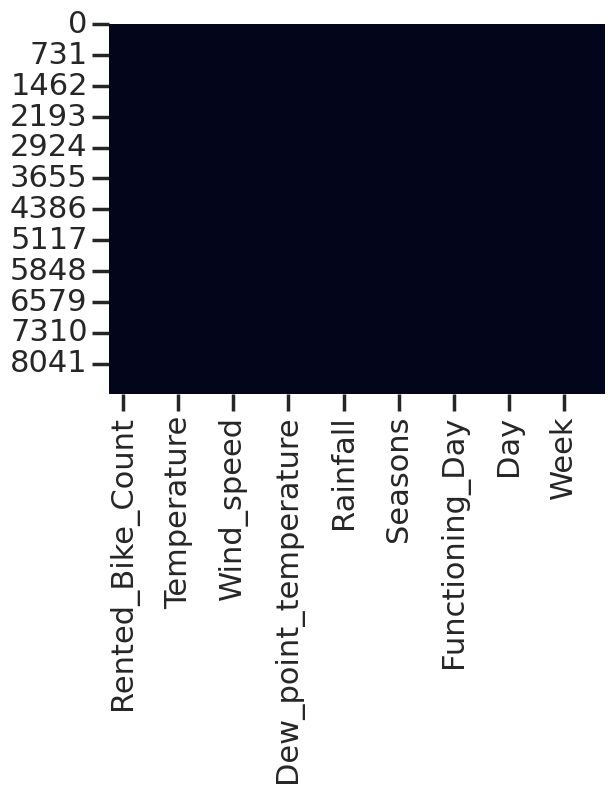

In [205]:
# Handling Missing Values & Missing Value Imputation# Handling Missing Values & Missing Value Imputation
# Missing Values/Null Values Count
print(df.isnull().sum())

# Visualizing the missing values
# Checking Null Value by plotting Heatmap
sns.heatmap(df.isnull(), cbar=False)

#### What all missing value imputation techniques have you used and why did you use those techniques?


Since, there were no missing values to handle in the given dataset no further manipulation was needed.

### 2. Handling Outliers

In [206]:
# Handling Outliers & Outlier treatments.
#since it has two observation for now converting into categorial later will change using onehot encoding
df['Year'] = df.Year.astype('str')
symmetric_feature=[]
non_symmetric_feature=[]
for i in df.describe().columns:
  if abs(df[i].mean()-df[i].median())<0.2:
    symmetric_feature.append(i)
  else:
    non_symmetric_feature.append(i)

# Getting Symmetric Distributed Features
print("Symmetric Distributed Features : -",symmetric_feature)

# Getting Skew Symmetric Distributed Features
print("Skew Symmetric Distributed Features : -",non_symmetric_feature)

#ignoring rainfall and snowfall due to sparsity(upto 75 percentile value was 0
# and this outliers are needed for model to learn)
#ignoring dependent variable as Outliers in the dependent variable may be 
#indicative of unusual or unexpected patterns in the data that could be of interest and should not be removed

#note: model perform well on capping outliers in both features after trial 

# symmetric_feature = symmetric_feature[:-2]
# non_symmetric_feature.pop(0)
# print("Symmetric Distributed Features : -",symmetric_feature)
# print("Skew Symmetric Distributed Features : -",non_symmetric_feature)

Symmetric Distributed Features : - ['Hour', 'Rainfall', 'Snowfall']
Skew Symmetric Distributed Features : - ['Rented_Bike_Count', 'Temperature', 'Humidity', 'Wind_speed', 'Visibility', 'Dew_point_temperature', 'Solar_Radiation']


In [207]:
def outlier_treatment(df,feature):
  upper_boundary= df[feature].mean()+3*df[feature].std()
  lower_boundary= df[feature].mean()-3*df[feature].std()
  return upper_boundary,lower_boundary

In [208]:
# Restricting/ capping the data to lower and upper boundry

for feature in symmetric_feature:
  #below lower value then value = lower value
  df.loc[df[feature]<= outlier_treatment(df=df,feature=feature)[1], feature]=outlier_treatment(df=df,feature=feature)[1]
  #above higher value, then value = higher value
  df.loc[df[feature]>= outlier_treatment(df=df,feature=feature)[0], feature]=outlier_treatment(df=df,feature=feature)[0]

In [209]:
# For Skew Symmetric features defining upper and lower boundry
#Outer Fence
def outlier_treatment_skew(df,feature):
  IQR= df[feature].quantile(0.75)- df[feature].quantile(0.25)
  lower_bridge =df[feature].quantile(0.25)-1.5*IQR
  upper_bridge =df[feature].quantile(0.75)+1.5*IQR
  # print(f'feature: {feature} IQR:{IQR} lower: {lower_bridge} upper:{upper_bridge}')
  return upper_bridge,lower_bridge

In [210]:
# Restricting the data to lower and upper boundry
for feature in non_symmetric_feature:
  df.loc[df[feature]<= outlier_treatment_skew(df=df,feature=feature)[1], feature]=outlier_treatment_skew(df=df,feature=feature)[1]
  df.loc[df[feature]>= outlier_treatment_skew(df=df,feature=feature)[0], feature]=outlier_treatment_skew(df=df,feature=feature)[0]

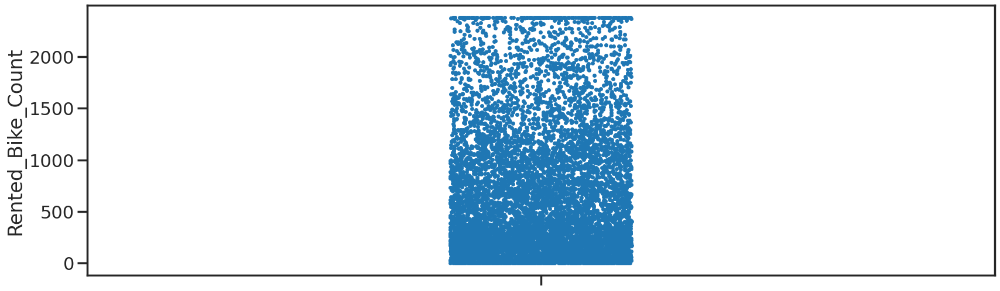

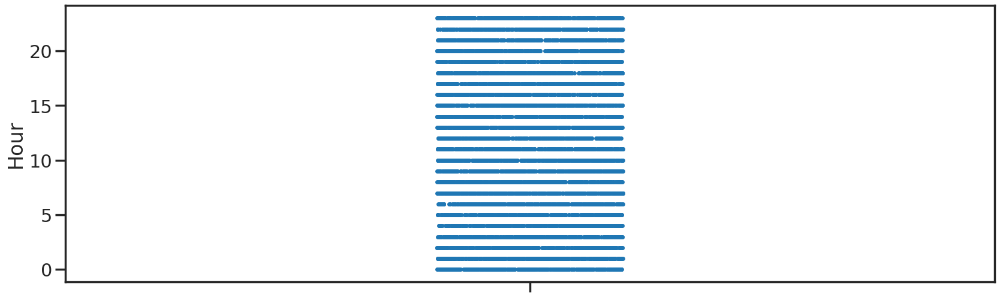

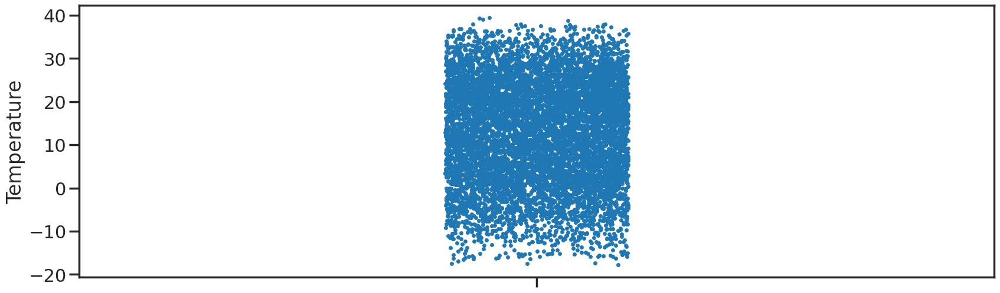

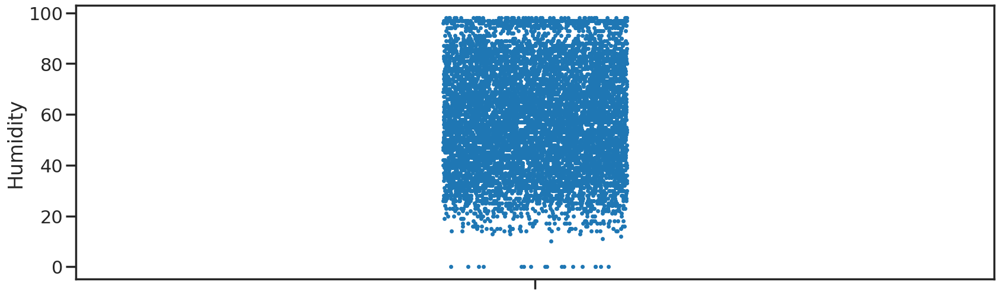

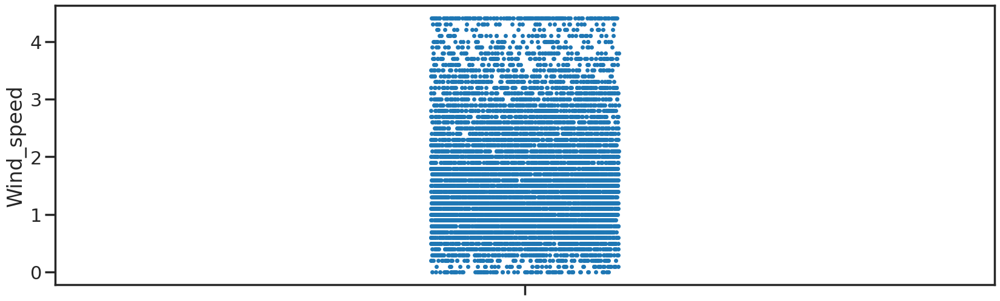

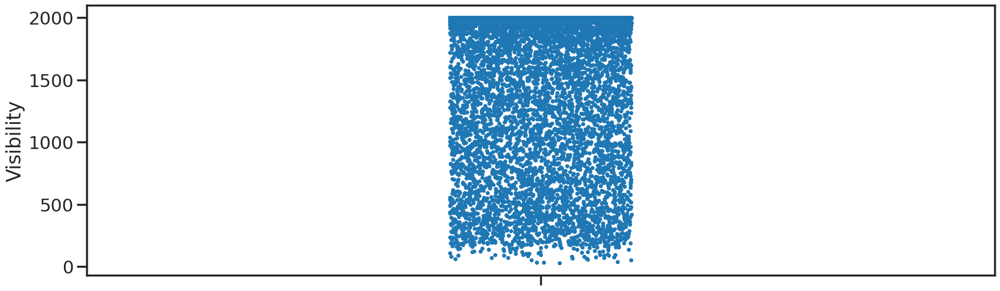

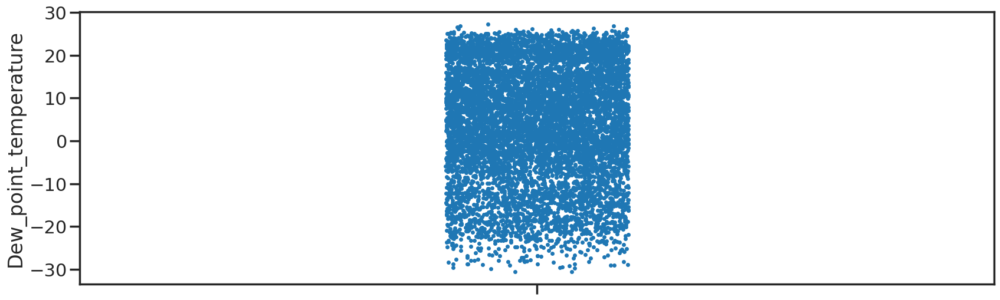

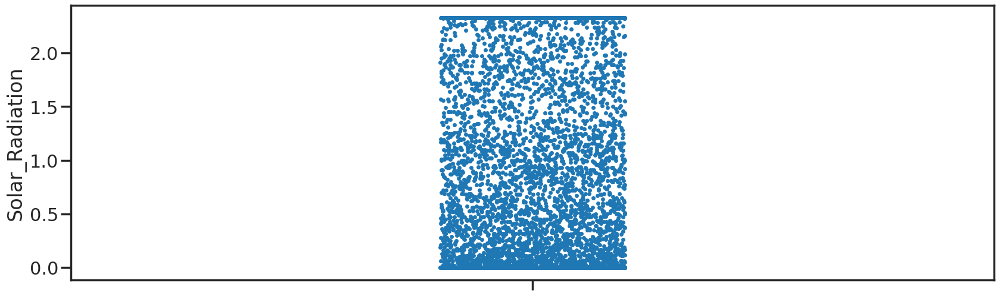

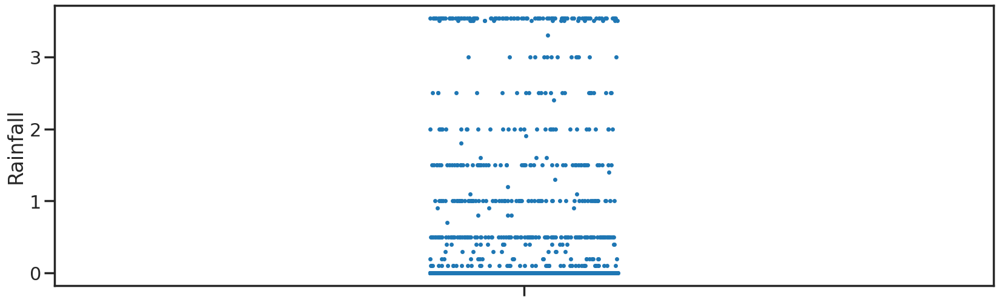

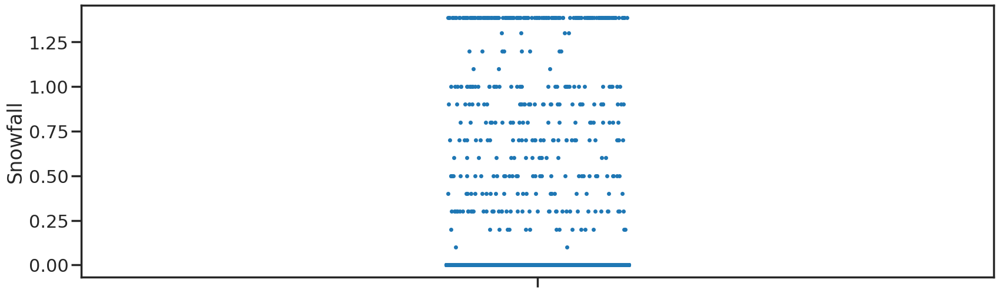

In [211]:
# After Outlier Treatment showing the dataset distribution using strip plot
# Visualising  code for the numerical columns 
for col in df.describe().columns:
  fig=plt.figure(figsize=(20,6))
  sns.stripplot(df[col])

##### What all outlier treatment techniques have you used and why did you use those techniques?

First I changed the Year column to sring as it shouldn't be treated as numerical column as there are only two type of values and should be treated as categorical column. Then I separated the skew symmetric and symmetric features and define the upper and lower boundry as defined below. Then, I used capping method to change outliers into upper and lower limit instead of trimming where i could have just removed the entire data.

Another way to do it is dropping extreme values.

In a Gaussian distribution while it’s the symmetric curve and outlier are present. Then, we can set the boundary by taking standard deviation into action.

Identifying which columns in a dataset have a symmetric distribution can be useful because it can give you insight into the overall shape of the distribution of values in each column. For example, if a column has a symmetric distribution, it may be more likely to have a bell-shaped curve when plotted on a histogram. This can be useful to know because certain statistical techniques and machine learning algorithms assume that the data is normally distributed, and having a symmetric distribution is one indication that the data may be approximately normally distributed. On the other hand, if a column has a non-symmetric distribution, it may be more likely to be skewed in one direction or the other, which could affect the validity of certain statistical tests or the performance of certain machine learning models.

The box plot is a useful graphical display for describing the behavior of the data in the middle as well as at the ends of the distributions. The box plot uses the median and the lower and upper quartiles (defined as the 25th and 75th percentiles). If the lower quartile is Q1 and the upper quartile is Q3, then the difference (Q3 — Q1) is called the interquartile range or IQ. A box plot is constructed by drawing a box between the upper and lower quartiles with a solid line drawn across the box to locate the median. The following quantities (called fences) are needed for identifying extreme values in the tails of the distribution:

lower inner fence: Q1–1.5*IQ
upper inner fence: Q3 + 1.5*IQ
lower outer fence: Q1–3*IQ
upper outer fence: Q3 + 3*IQ

In [212]:
#correlation(df_removed_var,0.6)
#correlation(df_removed_var,0.6)


### 4. Feature Manipulation & Selection

#### 1. Feature Selection

<Axes: >

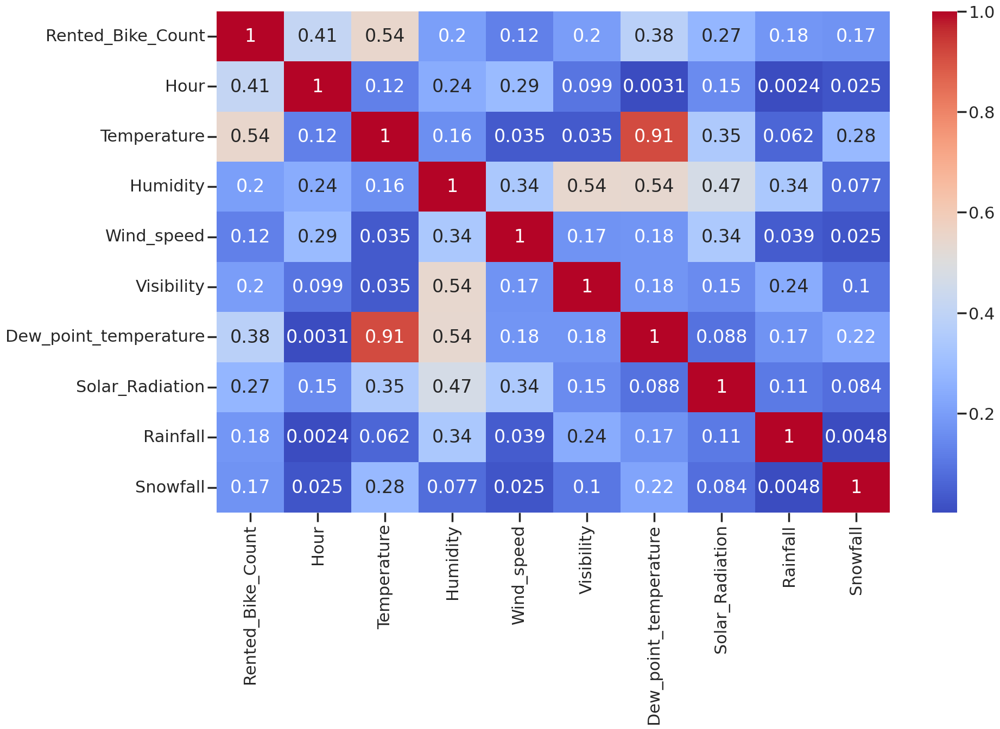

In [213]:
# Select your features wisely to avoid overfitting
#checking correlation with the help of heatmap
 ## Correlation
plt.figure(figsize=(20,12))
correlation = df.corr()
sns.heatmap(abs(correlation), annot=True, cmap='coolwarm')

 **Multicollinearity**

**VIF**

---
* Calculating vif identify the strength of correlation between independent variable and the strength of that correlation.

* Vif starts at 1 and has no upper limit.

* 1-5 : Moderate, No corrective measure

* Greater than 5: Severe, Coefficient and p-value are questionable


In [214]:
#Multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):
 
   # Calculating VIF
   vif = pd.DataFrame()
   vif["variables"] = X.columns
   vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
 
   return(vif)

In [215]:
dataset.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [216]:
calc_vif(dataset[[i for i in dataset.describe().columns if i not in ['Rented_Bike_Count'] ]])

,variables,VIF
0,Rented Bike Count,4.128938
1,Hour,5.043107
2,Temperature(°C),36.351729
3,Humidity(%),5.507031
4,Wind speed (m/s),4.806546
5,Visibility (10m),9.104336
6,Dew point temperature(°C),17.334133
7,Solar Radiation (MJ/m2),2.914067
8,Rainfall(mm),1.104359
9,Snowfall (cm),1.121057


As we can observe from the correlation heat map that the Temperature and the Dew point temperature columns are highly correlated hence the vif factor also high so to avoid multicollinearity which leads to overfitting we have decided to drop Dew point temperature column and again calculatig the VIF

In [217]:
calc_vif(dataset[[i for i in dataset.describe().columns if i not in ['Rented Bike Count',"Dew point temperature(°C)"] ]])

,variables,VIF
0,Hour,3.921832
1,Temperature(°C),3.228318
2,Humidity(%),4.868221
3,Wind speed (m/s),4.608625
4,Visibility (10m),4.710170
5,Solar Radiation (MJ/m2),2.246791
6,Rainfall(mm),1.079158
7,Snowfall (cm),1.120579


In [218]:
df.head()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,Month,Day,Year,Week,Time_Period
0,254.0,0.0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning
1,204.0,1.0,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning
2,173.0,2.0,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning
3,107.0,3.0,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning
4,78.0,4.0,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning


Now all the vif values are less than 5 so this columns can be considered important for model fitting.

In [219]:
df_2=df.copy()

In [220]:
#deleting multicollinear feature 
#df.drop(columns = ['Dew_point_temperature'], axis =1, inplace = True)


##### What all feature selection methods have you used  and why?

I have used correlation heatmap for checking the collinearity of the independent variable also checked the vif score of the variables.

##### Which all features you found important and why?

I have found that "Temperature and "Dew point temperature" are highly correlated so calculated the VIF and decided to drop Dew point temperature as it is less correlated with the target variable compared to Temperature column rest all the columns are important.

### 2. Categorical Encoding

In [221]:
df.head()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Dew_point_temperature,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,Month,Day,Year,Week,Time_Period
0,254.0,0.0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning
1,204.0,1.0,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning
2,173.0,2.0,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning
3,107.0,3.0,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning
4,78.0,4.0,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,Jan,Thursday,2017,Working Day,Morning


In [222]:
df.columns

Index(['Rented_Bike_Count', 'Hour', 'Temperature', 'Humidity', 'Wind_speed',
       'Visibility', 'Dew_point_temperature', 'Solar_Radiation', 'Rainfall',
       'Snowfall', 'Seasons', 'Holiday', 'Functioning_Day', 'Month', 'Day',
       'Year', 'Week', 'Time_Period'],
      dtype='object')

In [223]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Rented_Bike_Count      8760 non-null   float64
 1   Hour                   8760 non-null   float64
 2   Temperature            8760 non-null   float64
 3   Humidity               8760 non-null   int64  
 4   Wind_speed             8760 non-null   float64
 5   Visibility             8760 non-null   int64  
 6   Dew_point_temperature  8760 non-null   float64
 7   Solar_Radiation        8760 non-null   float64
 8   Rainfall               8760 non-null   float64
 9   Snowfall               8760 non-null   float64
 10  Seasons                8760 non-null   object 
 11  Holiday                8760 non-null   object 
 12  Functioning_Day        8760 non-null   object 
 13  Month                  8760 non-null   object 
 14  Day                    8760 non-null   object 
 15  Year

In [224]:
# Encode your categorical columns
cat_category = df_2.select_dtypes(include = 'object')
print(f'Categorial Features: {cat_category.columns.to_list()}')

Categorial Features: ['Seasons', 'Holiday', 'Functioning_Day', 'Month', 'Day', 'Year', 'Week', 'Time_Period']


⚡ Deleting some extra features like 'Day','Time_period','Year' and 'Month' because day has been converted into working and weekends, timeperiod as keeping hour since it show good correlation, month because it is already shorten to seasons and year because it does not have much variation and there is less to learn from that.

In [225]:
#deleting multicollinear feature 
df_2.drop(columns = ['Dew_point_temperature', 'Month', 'Day', 'Year', 'Time_Period'], axis =1, inplace = True)


In [226]:
df_2.head()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Solar_Radiation,Rainfall,Snowfall,Seasons,Holiday,Functioning_Day,Week
0,254.0,0.0,-5.2,37,2.2,2000,0.0,0.0,0.0,Winter,No Holiday,Yes,Working Day
1,204.0,1.0,-5.5,38,0.8,2000,0.0,0.0,0.0,Winter,No Holiday,Yes,Working Day
2,173.0,2.0,-6.0,39,1.0,2000,0.0,0.0,0.0,Winter,No Holiday,Yes,Working Day
3,107.0,3.0,-6.2,40,0.9,2000,0.0,0.0,0.0,Winter,No Holiday,Yes,Working Day
4,78.0,4.0,-6.0,36,2.3,2000,0.0,0.0,0.0,Winter,No Holiday,Yes,Working Day


In [227]:
#applying encoding to categorial features

df_2 = pd.get_dummies(df_2, drop_first = True)


In [228]:
df_2.head()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Solar_Radiation,Rainfall,Snowfall,Seasons_Spring,Seasons_Summer,Seasons_Winter,Holiday_No Holiday,Functioning_Day_Yes,Week_Working Day
0,254.0,0.0,-5.2,37,2.2,2000,0.0,0.0,0.0,0,0,1,1,1,1
1,204.0,1.0,-5.5,38,0.8,2000,0.0,0.0,0.0,0,0,1,1,1,1
2,173.0,2.0,-6.0,39,1.0,2000,0.0,0.0,0.0,0,0,1,1,1,1
3,107.0,3.0,-6.2,40,0.9,2000,0.0,0.0,0.0,0,0,1,1,1,1
4,78.0,4.0,-6.0,36,2.3,2000,0.0,0.0,0.0,0,0,1,1,1,1


In [229]:
#df_1.drop(columns = ["Seasons_Summer","Seasons_Winter","Holiday_No Holiday","Functioning_Day_Yes"], axis =1, inplace = True)

In [230]:
df_2.head()

,Rented_Bike_Count,Hour,Temperature,Humidity,Wind_speed,Visibility,Solar_Radiation,Rainfall,Snowfall,Seasons_Spring,Seasons_Summer,Seasons_Winter,Holiday_No Holiday,Functioning_Day_Yes,Week_Working Day
0,254.0,0.0,-5.2,37,2.2,2000,0.0,0.0,0.0,0,0,1,1,1,1
1,204.0,1.0,-5.5,38,0.8,2000,0.0,0.0,0.0,0,0,1,1,1,1
2,173.0,2.0,-6.0,39,1.0,2000,0.0,0.0,0.0,0,0,1,1,1,1
3,107.0,3.0,-6.2,40,0.9,2000,0.0,0.0,0.0,0,0,1,1,1,1
4,78.0,4.0,-6.0,36,2.3,2000,0.0,0.0,0.0,0,0,1,1,1,1


#### What all categorical encoding techniques have you used & why did you use those techniques?

Since there were not much of different unique categories in each categorial feature, I used one hot encoding function which simply converts each feature into 0 and 1.

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

<Axes: xlabel='Rented_Bike_Count', ylabel='Density'>

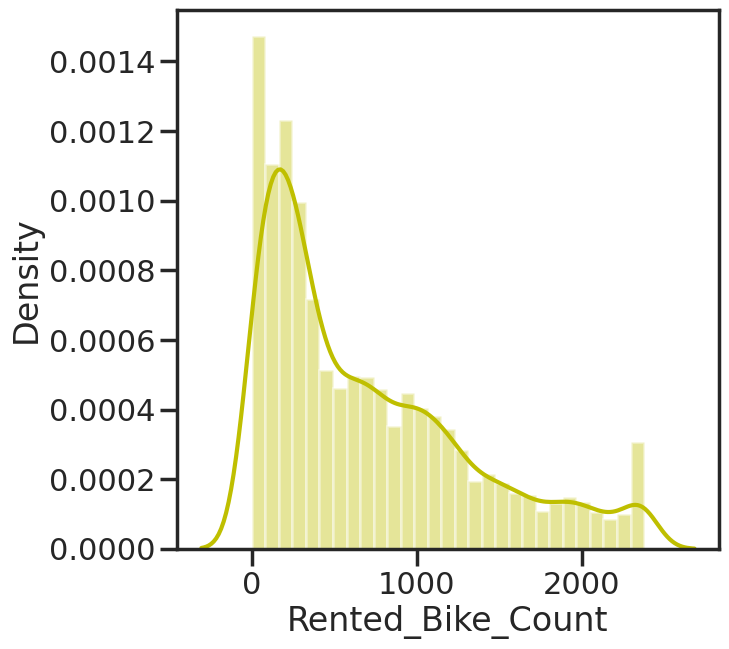

In [231]:
# Transform Your data
# Dependent variable 'Rented bike count'
plt.figure(figsize=(7,7))
sns.distplot(df['Rented_Bike_Count'],color="y")

From the above plot we can observe that the dependent variable is right skewed or positively skewed so it is needed to be transformed before fitting any model.


<Axes: xlabel='Rented_Bike_Count', ylabel='Density'>

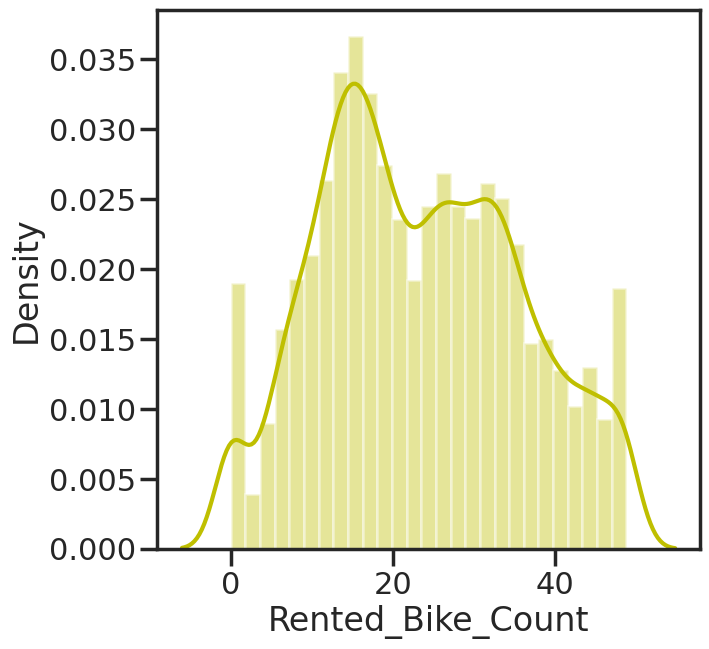

In [232]:
# Dependent variable 'Rented bike count'
plt.figure(figsize=(7,7))
sns.distplot(np.sqrt(df['Rented_Bike_Count']),color="y")

Here as the variable is moderately skewed square root transformation is applied to the varriable

### 6. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

This dataset doesnot need any dimensionality reduction.

Dimensionality reduction is a technique that is used to reduce the number of features in a dataset. It is often used when the number of features is very large, as this can lead to problems such as overfitting and slow computation. There are a variety of techniques that can be used for dimensionality reduction, such as principal component analysis (PCA) and singular value decomposition (SVD).

There are several reasons why dimensionality reduction might be useful. One reason is that it can help to reduce the size of a dataset, which can be particularly useful when the dataset is very large. It can also help to improve the performance of machine learning models by reducing the number of features that the model has to consider, which can lead to faster computation and better generalization to new data.

Another reason to use dimensionality reduction is to reduce the curse of dimensionality, which refers to the fact that as the number of dimensions increases, the volume of the space increases exponentially. This can lead to problems such as the nearest neighbor search becoming less effective, as the distances between points become much larger. Dimensionality reduction can help to reduce the curse of dimensionality by reducing the number of dimensions in the data.

Finally, dimensionality reduction can also be useful for visualizing high-dimensional data. It can be difficult to visualize data in more than three dimensions, so reducing the number of dimensions can make it easier to understand the patterns in the data.

### 7. Data Splitting

In [233]:
# Split your data to train and test. Choose Splitting ratio wisely.
# Train - Spliting  data
independent_variables = df_2.columns.tolist()[1:]
dependent_variable = ['Rented_Bike_Count']

print(independent_variables)
print(dependent_variable)

['Hour', 'Temperature', 'Humidity', 'Wind_speed', 'Visibility', 'Solar_Radiation', 'Rainfall', 'Snowfall', 'Seasons_Spring', 'Seasons_Summer', 'Seasons_Winter', 'Holiday_No Holiday', 'Functioning_Day_Yes', 'Week_Working Day']
['Rented_Bike_Count']


In [234]:
# Train - Spliting  data
x = (df_2[independent_variables])
y =(np.sqrt(df_2[dependent_variable]))

In [235]:
# splitting the data into a train and a test set. we do this using train test split.
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)  

##### What data splitting ratio have you used and why? 

In this case I have used 80:20 split as splitting in any ratio 80/20 or 70/30 deos not affect unless there is less values in dataset. However, there are two competing concerns: with less training data, parameter estimates have greater variance. With less testing data, performance statistic will have greater variance. it is best to divide data such that neither the variance in the training set nor the variance in the test set is too high.

Example : If you have a total of 100 instances, you're probably stuck with cross validation as no single split is going to give you satisfactory variance in your estimates. If you have 100,000 instances, it doesn't really matter whether you choose an 80:20 split or a 90:10 split (indeed you may choose to use less training data if your method is particularly computationally intensive).

80/20 is quite a commonly occurring ratio, often referred to as the Pareto principle. It's usually a safe bet if you use that ratio.

### 8. Data Scaling

In [236]:
# Scaling the data.
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

##### Which method have you used to scale you data and why?

When we are using an algorithm that assumes your features have a similar range, we should use feature scaling.

If the ranges of features differ much then we should use feature scaling. If the range does not vary a lot like one of them is between 0 and 2 and the other one is between -1 and 0.5 then we can leave them as it's. However, we should use feature scaling if the ranges are, for example, between -2 and 2 and between -100 and 100.

Use Standardization when your data follows Gaussian distribution. Use Normalization when your data does not follow Gaussian distribution.

So, in my data few of the features were having large difference in distribution, that's why, I have used standardization using standardscaler on the dataset.

### 9. Handling Imbalanced Dataset

##### Do you think the dataset is imbalanced? Explain Why.

Imbalanced dataset is relevant primarily in the context of supervised machine learning involving two or more classes.

Imbalance means that the number of data points available for different the classes is different: If there are two classes, then balanced data would mean 50% points for each of the class. For most machine learning techniques, little imbalance is not a problem. So, if there are 60% points for one class and 40% for the other class, it should not cause any significant performance degradation. Only when the class imbalance is high, e.g. 90% points for one class and 10% for the other, standard optimization criteria or performance measures may not be as effective and would need modification.

In our case it is not required and imbalanced class like functioning day and holiday are already removed. Secondly, class imbalance applies to classification problems, where the goal is to predict a class label. In a regression problem, where the goal is to predict a continuous numerical target value, class imbalance is generally not a concern.

##### What technique did you use to handle the imbalance dataset and why? (If needed to be balanced)

Answer Here.

## ***6. ML Model Implementation***

### ML Model - 1  Linear Regression

In [237]:
# ML Model - 1 Implementation
model_lr = LinearRegression()
# Fit the Algorithm
model_lr.fit(x_train, y_train)

LinearRegression()

In [238]:
# Checking the coefficients
model_lr.intercept_

array([23.49406315])

In [239]:
# Checking the intercept value
model_lr.coef_

array([[ 3.43994406,  5.53986212, -2.62074392,  0.16705052,  0.04887623,
        -0.53095778, -2.64152567,  0.05959397, -1.21756053, -1.23964292,
        -3.45150448,  0.58399409,  5.02161875,  0.32829991]])

In [240]:
y_pred_train_linear = model_lr.predict(x_train)

In [241]:
y_pred_linear = model_lr.predict(x_test)

In [242]:
r2_score(((y_train)**2),((y_pred_train_linear)**2))

0.6085699307977108

In [243]:
r2_score(((y_test)**2),((y_pred_linear)**2))

0.6053303390048461

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [244]:
# Visualizing evaluation Metric Score chart
# Calculating the performance metrics.
MAE_linear = round(mean_absolute_error((y_test)**2,(y_pred_linear)**2),4)
print(f"Mean Absolute Error : {MAE_linear}")

MSE_linear = round(mean_squared_error((y_test)**2,(y_pred_linear)**2),4)
print(f"Mean squared Error : {MSE_linear}")

RMSE_linear = round(np.sqrt(MSE_linear),4)
print(f"Root Mean squared Error : {RMSE_linear}")

R2_linear = round(r2_score((y_test)**2, (y_pred_linear)**2),4)
print(f"R2 score : {R2_linear}")

Adjusted_R2_linear = round(1-(1-r2_score(y_test**2,y_pred_linear**2))*((x_test.shape[0]-1)/(x_test.shape[0]-x_test.shape[1]-1)),3)
print(f"Adjusted R2 score : {Adjusted_R2_linear}")


Mean Absolute Error : 269.9089
Mean squared Error : 155855.0351
Root Mean squared Error : 394.7848
R2 score : 0.6053
Adjusted R2 score : 0.602


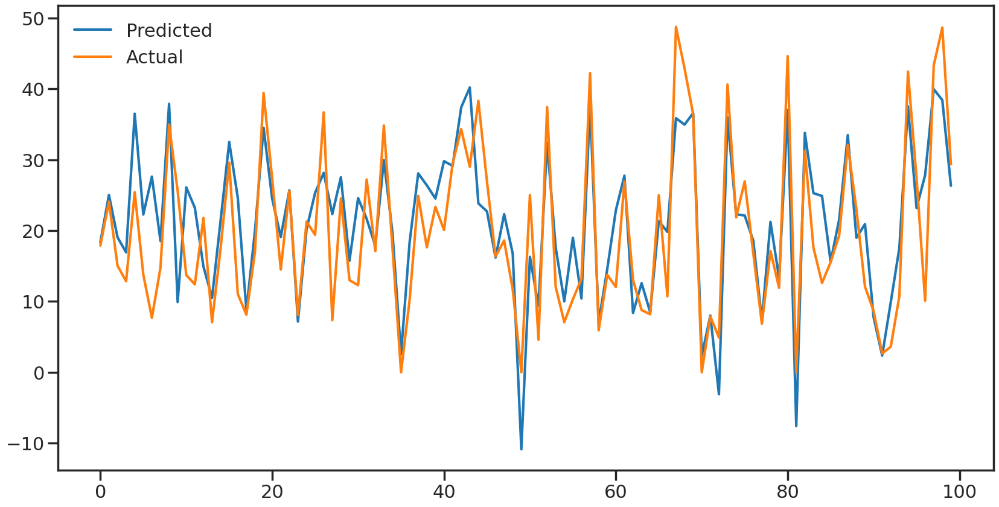

In [245]:
 # ploting the line graph of actual and predicted values

plt.figure(figsize=(20,10))
plt.plot((y_pred_linear)[:100])
plt.plot((np.array(y_test)[:100]))
plt.legend(["Predicted","Actual"])
plt.show()

In [246]:
# storing the above data into a dataframe
linear_regessor_list = {'Mean Absolute Error' : MAE_linear,'Mean squared Error' : MSE_linear,
                   'Root Mean squared Error' : RMSE_linear,'R2 score' : R2_linear,'Adjusted R2 score' : Adjusted_R2_linear }

In [247]:
# converting above dict into a dataframe
metric_df = pd.DataFrame.from_dict(linear_regessor_list, orient='index').reset_index()

In [248]:
# renaming the columns.
metric_df = metric_df.rename(columns={'index':'Metric',0:'Linear Regression'})
metric_df

,Metric,Linear Regression
0,Mean Absolute Error,269.9089
1,Mean squared Error,155855.0351
2,Root Mean squared Error,394.7848
3,R2 score,0.6053
4,Adjusted R2 score,0.6020


### ML Model - 2 Lasso Regression

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [249]:
# Initializing the model with some base values.
lasso  = Lasso(alpha=0.0001 , max_iter= 2000)

In [250]:
# Fitting the model on our training data.
lasso.fit(x_train, y_train)

Lasso(alpha=0.0001, max_iter=2000)

In [251]:
lasso.intercept_

array([23.49406315])

In [252]:
lasso.coef_

array([ 3.43997478,  5.53923528, -2.62043427,  0.16686516,  0.04894015,
       -0.53051881, -2.64146359,  0.05940869, -1.21723513, -1.23908657,
       -3.4513351 ,  0.5838761 ,  5.02142046,  0.32821014])

In [253]:
y_pred_train_lasso = lasso.predict(x_train)

In [254]:
y_pred_lasso = lasso.predict(x_test)

In [255]:
r2_score(((y_train)**2),((y_pred_train_lasso)**2))

0.6085627658505834

In [256]:
r2_score(((y_test)**2),((y_pred_lasso)**2))

0.6053218583456217

In [257]:
# Visualizing evaluation Metric Score chart
# Calculating the performance metrics.
MAE_lasso = round(mean_absolute_error((y_test)**2,(y_pred_lasso)**2),4)
print(f"Mean Absolute Error : {MAE_lasso}")

MSE_lasso = round(mean_squared_error((y_test)**2,(y_pred_lasso)**2),4)
print(f"Mean squared Error : {MSE_lasso}")

RMSE_lasso = round(np.sqrt(MSE_lasso),4)
print(f"Root Mean squared Error : {RMSE_lasso}")

R2_lasso = round(r2_score((y_test)**2, (y_pred_lasso)**2),4)
print(f"R2 score : {R2_lasso}")

Adjusted_R2_lasso = round(1-(1-r2_score(y_test**2,y_pred_lasso**2))*((x_test.shape[0]-1)/(x_test.shape[0]-x_test.shape[1]-1)),3)
print(f"Adjusted R2 score : {Adjusted_R2_lasso}")


Mean Absolute Error : 269.9117
Mean squared Error : 155858.3841
Root Mean squared Error : 394.789
R2 score : 0.6053
Adjusted R2 score : 0.602


In [258]:
# Now saving these metrics to our metrics dataframe. First we save them in a list and then we pass them to the df.
metric_df['Lasso'] = [MAE_lasso, MSE_lasso, RMSE_lasso, R2_lasso, Adjusted_R2_lasso]
metric_df

,Metric,Linear Regression,Lasso
0,Mean Absolute Error,269.9089,269.9117
1,Mean squared Error,155855.0351,155858.3841
2,Root Mean squared Error,394.7848,394.7890
3,R2 score,0.6053,0.6053
4,Adjusted R2 score,0.6020,0.6020


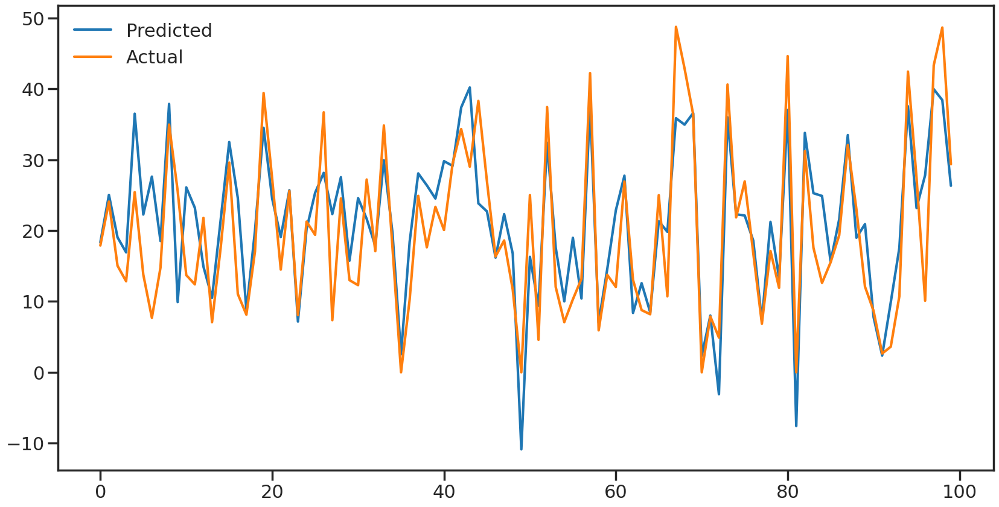

In [259]:
 # ploting the line graph of actual and predicted values

plt.figure(figsize=(20,10))
plt.plot((y_pred_lasso)[:100])
plt.plot((np.array(y_test)[:100]))
plt.legend(["Predicted","Actual"])
plt.show()

#### 2. Cross- Validation & Hyperparameter Tuning

In [260]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# Cross validation. optimizing our model by finding the best value of our hyperparameter.
from sklearn.model_selection import GridSearchCV

lasso_param_grid = {'alpha': [1e-15,1e-13,1e-10,1e-8,1e-5,1e-4,1e-3,0.005,0.006,0.007,0.01,0.015,0.02,1e-1,1,5,10,20,30,40,45,50]}  # list of parameters. 
                                                                                  
lasso_regressor = GridSearchCV(lasso, lasso_param_grid, scoring='neg_mean_squared_error', cv=5)
# Fit the Algorithm
lasso_regressor.fit(x_train, y_train)



GridSearchCV(cv=5, estimator=Lasso(alpha=0.0001, max_iter=2000),
             param_grid={'alpha': [1e-15, 1e-13, 1e-10, 1e-08, 1e-05, 0.0001,
                                   0.001, 0.005, 0.006, 0.007, 0.01, 0.015,
                                   0.02, 0.1, 1, 5, 10, 20, 30, 40, 45, 50]},
             scoring='neg_mean_squared_error')

In [261]:
# Predict on the model
y_pred_lasso_cv = lasso_regressor.predict(x_test)

In [262]:
# Calculating the performance metrics.
MAE_lasso_cv = round(mean_absolute_error((y_test)**2,(y_pred_lasso_cv)**2),4)
print(f"Mean Absolute Error : {MAE_lasso_cv}")

MSE_lasso_cv = round(mean_squared_error((y_test)**2,(y_pred_lasso_cv)**2),4)
print(f"Mean squared Error : {MSE_lasso_cv}")

RMSE_lasso_cv = round(np.sqrt(MSE_lasso_cv),4)
print(f"Root Mean squared Error : {RMSE_lasso_cv}")

R2_lasso_cv = round(r2_score((y_test)**2, (y_pred_lasso_cv)**2),4)
print(f"R2 score : {R2_lasso_cv}")

Adjusted_R2_lasso_cv = round(1-(1-r2_score(y_test**2,y_pred_lasso_cv**2))*((x_test.shape[0]-1)/(x_test.shape[0]-x_test.shape[1]-1)),3)
print(f"Adjusted R2 score : {Adjusted_R2_lasso_cv}")


Mean Absolute Error : 270.0498
Mean squared Error : 156024.598
Root Mean squared Error : 394.9995
R2 score : 0.6049
Adjusted R2 score : 0.602


In [263]:
# Now saving these metrics to our metrics dataframe. First we save them in a list and then we pass them to the df.
metric_df['Lasso_cv'] = [MAE_lasso_cv, MSE_lasso_cv, RMSE_lasso_cv, R2_lasso_cv, Adjusted_R2_lasso_cv]
metric_df

,Metric,Linear Regression,Lasso,Lasso_cv
0,Mean Absolute Error,269.9089,269.9117,270.0498
1,Mean squared Error,155855.0351,155858.3841,156024.5980
2,Root Mean squared Error,394.7848,394.7890,394.9995
3,R2 score,0.6053,0.6053,0.6049
4,Adjusted R2 score,0.6020,0.6020,0.6020


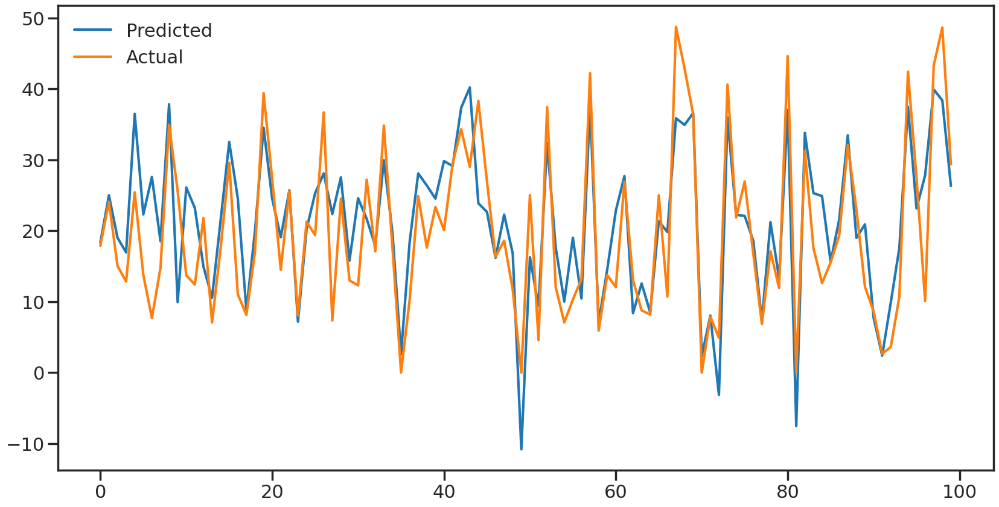

In [264]:
 # ploting the line graph of actual and predicted values

plt.figure(figsize=(20,10))
plt.plot((y_pred_lasso_cv)[:100])
plt.plot((np.array(y_test)[:100]))
plt.legend(["Predicted","Actual"])
plt.show()

##### Which hyperparameter optimization technique have you used and why?

GridSearchCV which uses the Grid Search technique for finding the optimal hyperparameters to increase the model performance.

our goal should be to find the best hyperparameters values to get the perfect prediction results from our model. But the question arises, how to find these best sets of hyperparameters? One can try the Manual Search method, by using the hit and trial process and can find the best hyperparameters which would take huge time to build a single model.

For this reason, methods like Random Search, GridSearch were introduced. Grid Search uses a different combination of all the specified hyperparameters and their values and calculates the performance for each combination and selects the best value for the hyperparameters. This makes the processing time-consuming and expensive based on the number of hyperparameters involved.

In GridSearchCV, along with Grid Search, cross-validation is also performed. Cross-Validation is used while training the model.

That's why I have used GridsearCV method for hyperparameter optimization.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

No I Haven't seen any significant improvement.

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

* Root mean squared error (RMSE): The RMSE is a measure of the average squared error of the model's predictions. It is calculated as the square root of the mean squared error (MSE). In a business context, a low RMSE can indicate that the model is making relatively small errors, which could be important if the model is being used to make important decisions or allocate resources.

* Mean absolute error (MAE): The MAE is a measure of the average absolute error of the model's predictions. It is calculated as the sum of the absolute differences between the predicted values and the actual values, divided by the number of predictions. In a business context, a low MAE can indicate that the model is making relatively small errors, which could be important if the model is being used to make important decisions or allocate resources.


* R2 score: The R2 score, also known as the coefficient of determination, is a measure of how well the model fits the data. It ranges from 0 to 1, with a higher value indicating a better fit. A high R2 score suggests that the model is able to explain a large portion of the variance in the data. In a business context, a high R2 score can indicate that the model is able to make accurate predictions, which could have a positive impact on decision-making and resource allocation.


* Adjusted R2 score: The adjusted R2 score is similar to the R2 score, but it adjusts for the number of variables in the model. A higher adjusted R2 score suggests that the model is able to explain a large portion of the variance in the data while also taking into account the complexity of the model. In a business context, a high adjusted R2 score can indicate that the model is able to make accurate predictions with a reasonable level of complexity, which could be more practical for deployment in a business setting.

### ML Model - 3 Ridge Regression.

In [265]:
# ML Model - 3 Implementation
from sklearn.linear_model import Ridge

ridge  = Ridge(alpha=0.1)

# Fit the Algorithm
ridge.fit(x_train,y_train)

# Predict on the model
y_pred_ridge = ridge.predict(x_test)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [266]:
# Visualizing evaluation Metric Score chart
# Calculating the performance metrics.
MAE_ridge = round(mean_absolute_error((y_test)**2,(y_pred_ridge)**2),4)
print(f"Mean Absolute Error : {MAE_ridge}")

MSE_ridge = round(mean_squared_error((y_test)**2,(y_pred_ridge)**2),4)
print(f"Mean squared Error : {MSE_ridge}")

RMSE_ridge = round(np.sqrt(MSE_ridge),4)
print(f"Root Mean squared Error : {RMSE_ridge}")

R2_ridge = round(r2_score((y_test)**2, (y_pred_ridge)**2),4)
print(f"R2 score : {R2_ridge}")

Adjusted_R2_ridge = round(1-(1-r2_score(y_test**2,y_pred_ridge**2))*((x_test.shape[0]-1)/(x_test.shape[0]-x_test.shape[1]-1)),3)
print(f"Adjusted R2 score : {Adjusted_R2_ridge}")




Mean Absolute Error : 269.91
Mean squared Error : 155856.3865
Root Mean squared Error : 394.7865
R2 score : 0.6053
Adjusted R2 score : 0.602


In [267]:
# Now saving these metrics to our metrics dataframe. First we save them in a list and then we pass them to the df.
metric_df['Ridge'] = [MAE_ridge, MSE_ridge, RMSE_ridge, R2_ridge, Adjusted_R2_ridge]
metric_df

,Metric,Linear Regression,Lasso,Lasso_cv,Ridge
0,Mean Absolute Error,269.9089,269.9117,270.0498,269.9100
1,Mean squared Error,155855.0351,155858.3841,156024.5980,155856.3865
2,Root Mean squared Error,394.7848,394.7890,394.9995,394.7865
3,R2 score,0.6053,0.6053,0.6049,0.6053
4,Adjusted R2 score,0.6020,0.6020,0.6020,0.6020


#### 2. Cross- Validation & Hyperparameter Tuning

In [268]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# Hyperprarameter tuning
ridge = Ridge()
parameters = {'alpha': [1e-15,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1,5,10,20,30,40,45,50,55,60,100]}
ridge_regressor = GridSearchCV(ridge, parameters, scoring='neg_mean_squared_error', cv=3)
# Fit the Algorithm
ridge_regressor.fit(x_train,y_train)

# Predict on the model
y_pred_ridge_cv = ridge_regressor.predict(x_test)

In [269]:
# Calculating the performance metrics.
MAE_ridge_cv = round(mean_absolute_error((y_test)**2,(y_pred_ridge_cv)**2),4)
print(f"Mean Absolute Error : {MAE_ridge_cv}")

MSE_ridge_cv = round(mean_squared_error((y_test)**2,(y_pred_ridge_cv)**2),4)
print(f"Mean squared Error : {MSE_ridge_cv}")

RMSE_ridge_cv = round(np.sqrt(MSE_ridge_cv),4)
print(f"Root Mean squared Error : {RMSE_ridge_cv}")

R2_ridge_cv = round(r2_score((y_test)**2, (y_pred_ridge_cv)**2),4)
print(f"R2 score : {R2_ridge_cv}")

Adjusted_R2_ridge_cv = round(1-(1-r2_score(y_test**2,y_pred_ridge_cv**2))*((x_test.shape[0]-1)/(x_test.shape[0]-x_test.shape[1]-1)),3)
print(f"Adjusted R2 score : {Adjusted_R2_ridge_cv}")


Mean Absolute Error : 269.9644
Mean squared Error : 155922.7626
Root Mean squared Error : 394.8706
R2 score : 0.6052
Adjusted R2 score : 0.602


In [270]:
# Now saving these metrics to our metrics dataframe. First we save them in a list and then we pass them to the df.
metric_df['Ridge_cv'] = [MAE_ridge_cv, MSE_ridge_cv, RMSE_ridge_cv, R2_ridge_cv, Adjusted_R2_ridge_cv]
metric_df

,Metric,Linear Regression,Lasso,Lasso_cv,Ridge,Ridge_cv
0,Mean Absolute Error,269.9089,269.9117,270.0498,269.9100,269.9644
1,Mean squared Error,155855.0351,155858.3841,156024.5980,155856.3865,155922.7626
2,Root Mean squared Error,394.7848,394.7890,394.9995,394.7865,394.8706
3,R2 score,0.6053,0.6053,0.6049,0.6053,0.6052
4,Adjusted R2 score,0.6020,0.6020,0.6020,0.6020,0.6020


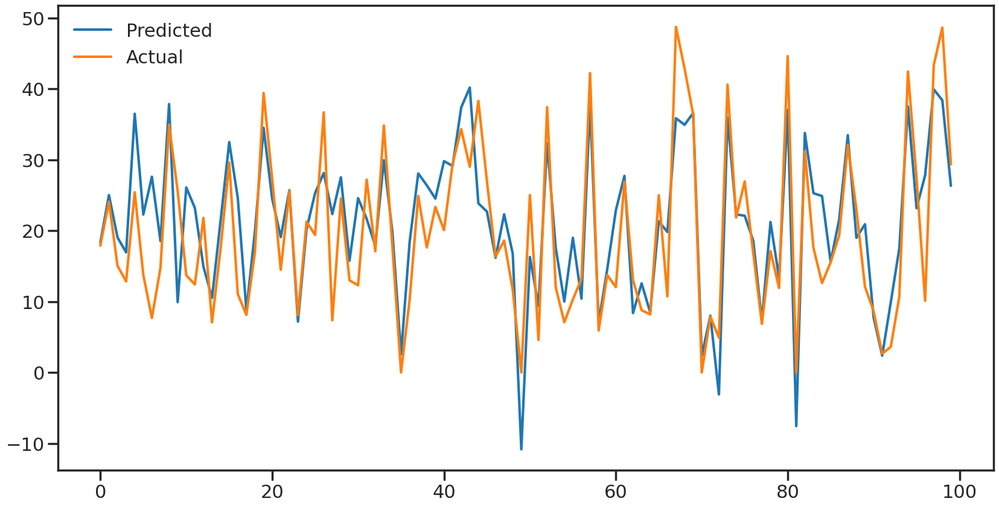

In [271]:
plt.figure(figsize=(20,10))
plt.plot((y_pred_ridge_cv)[:100])
plt.plot((np.array(y_test)[:100]))
plt.legend(["Predicted","Actual"])
plt.show()

##### Which hyperparameter optimization technique have you used and why?

GridSearchCV which uses the Grid Search technique for finding the optimal hyperparameters to increase the model performance.

our goal should be to find the best hyperparameters values to get the perfect prediction results from our model. But the question arises, how to find these best sets of hyperparameters? One can try the Manual Search method, by using the hit and trial process and can find the best hyperparameters which would take huge time to build a single model.

For this reason, methods like Random Search, GridSearch were introduced. Grid Search uses a different combination of all the specified hyperparameters and their values and calculates the performance for each combination and selects the best value for the hyperparameters. This makes the processing time-consuming and expensive based on the number of hyperparameters involved.

In GridSearchCV, along with Grid Search, cross-validation is also performed. Cross-Validation is used while training the model.

That's why I have used GridsearCV method for hyperparameter optimization.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

No I Haven't seen any significant improvement.

### 1. Which Evaluation metrics did you consider for a positive business impact and why?

* Root mean squared error (RMSE): The RMSE is a measure of the average squared error of the model's predictions. It is calculated as the square root of the mean squared error (MSE). In a business context, a low RMSE can indicate that the model is making relatively small errors, which could be important if the model is being used to make important decisions or allocate resources.

* Mean absolute error (MAE): The MAE is a measure of the average absolute error of the model's predictions. It is calculated as the sum of the absolute differences between the predicted values and the actual values, divided by the number of predictions. In a business context, a low MAE can indicate that the model is making relatively small errors, which could be important if the model is being used to make important decisions or allocate resources.


* R2 score: The R2 score, also known as the coefficient of determination, is a measure of how well the model fits the data. It ranges from 0 to 1, with a higher value indicating a better fit. A high R2 score suggests that the model is able to explain a large portion of the variance in the data. In a business context, a high R2 score can indicate that the model is able to make accurate predictions, which could have a positive impact on decision-making and resource allocation.


* Adjusted R2 score: The adjusted R2 score is similar to the R2 score, but it adjusts for the number of variables in the model. A higher adjusted R2 score suggests that the model is able to explain a large portion of the variance in the data while also taking into account the complexity of the model. In a business context, a high adjusted R2 score can indicate that the model is able to make accurate predictions with a reasonable level of complexity, which could be more practical for deployment in a business setting.

### ML Model - 4 Decision Tree.

In [272]:
# ML Model - 4 Implementation.
from sklearn.tree import DecisionTreeRegressor
Bike_regressor = DecisionTreeRegressor( max_leaf_nodes=10, random_state=0)

# Fit the Algorithm
Bike_regressor.fit(x_train,y_train)

# Predict on the model
y_pred_dt = Bike_regressor.predict(x_test)


1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.


In [273]:
# Visualizing evaluation Metric Score chart
# Calculating the performance metrics.
MAE_dt= round(mean_absolute_error((y_test)**2,(y_pred_dt)**2),4)
print(f"Mean Absolute Error : {MAE_dt}")

MSE_dt = round(mean_squared_error((y_test)**2,(y_pred_dt)**2),4)
print(f"Mean squared Error : {MSE_dt}")

RMSE_dt = round(np.sqrt(MSE_dt),4)
print(f"Root Mean squared Error : {RMSE_dt}")

R2_dt = round(r2_score((y_test)**2, (y_pred_dt)**2),4)
print(f"R2 score : {R2_dt}")

Adjusted_R2_dt = round(1-(1-r2_score(y_test**2,y_pred_dt**2))*((x_test.shape[0]-1)/(x_test.shape[0]-x_test.shape[1]-1)),3)
print(f"Adjusted R2 score : {Adjusted_R2_dt}")


Mean Absolute Error : 243.181
Mean squared Error : 124272.5173
Root Mean squared Error : 352.5231
R2 score : 0.6853
Adjusted R2 score : 0.683


In [274]:
# Now saving these metrics to our metrics dataframe. First we save them in a list and then we pass them to the df.
metric_df['Decision_Tree'] = [MAE_dt, MSE_dt, RMSE_dt, R2_dt, Adjusted_R2_dt]
metric_df

,Metric,Linear Regression,Lasso,Lasso_cv,Ridge,Ridge_cv,Decision_Tree
0,Mean Absolute Error,269.9089,269.9117,270.0498,269.9100,269.9644,243.1810
1,Mean squared Error,155855.0351,155858.3841,156024.5980,155856.3865,155922.7626,124272.5173
2,Root Mean squared Error,394.7848,394.7890,394.9995,394.7865,394.8706,352.5231
3,R2 score,0.6053,0.6053,0.6049,0.6053,0.6052,0.6853
4,Adjusted R2 score,0.6020,0.6020,0.6020,0.6020,0.6020,0.6830


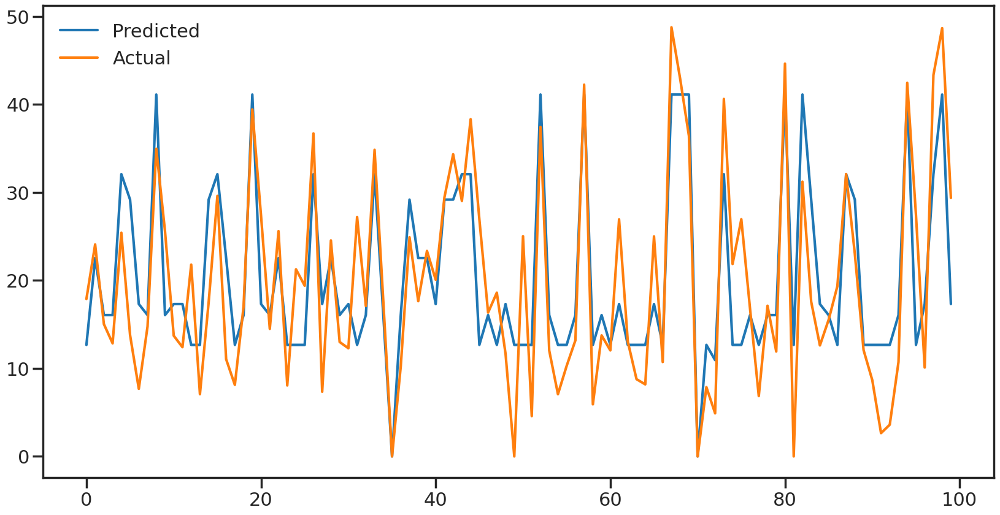

In [275]:
plt.figure(figsize=(20,10))
plt.plot((y_pred_dt)[:100])
plt.plot((np.array(y_test)[:100]))
plt.legend(["Predicted","Actual"])
plt.show()

### ML Model - 5 Random Forest.

In [276]:
# ML Model - 5 Implementation.
from sklearn.ensemble import RandomForestRegressor

# Fit the Algorithm
model_rf = RandomForestRegressor().fit(x_train, y_train)

# Predict on the model
y_pred_rf =model_rf.predict(x_test)

In [277]:
y_pred_train=model_rf.predict(x_train)

In [278]:
r2_score(y_train**2,y_pred_train**2)

0.9855147267083464


1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.


In [279]:
# Visualizing evaluation Metric Score chart
# Calculating the performance metrics.
MAE_rf= round(mean_absolute_error((y_test)**2,(y_pred_rf)**2),4)
print(f"Mean Absolute Error : {MAE_rf}")

MSE_rf = round(mean_squared_error((y_test)**2,(y_pred_rf)**2),4)
print(f"Mean squared Error : {MSE_rf}")

RMSE_rf = round(np.sqrt(MSE_rf),4)
print(f"Root Mean squared Error : {RMSE_rf}")

R2_rf = round(r2_score((y_test)**2, (y_pred_rf)**2),4)
print(f"R2 score : {R2_rf}")

Adjusted_R2_rf = round(1-(1-r2_score(y_test**2,y_pred_rf**2))*((x_test.shape[0]-1)/(x_test.shape[0]-x_test.shape[1]-1)),3)
print(f"Adjusted R2 score : {Adjusted_R2_rf}")


Mean Absolute Error : 119.9987
Mean squared Error : 39621.7555
Root Mean squared Error : 199.0521
R2 score : 0.8997
Adjusted R2 score : 0.899


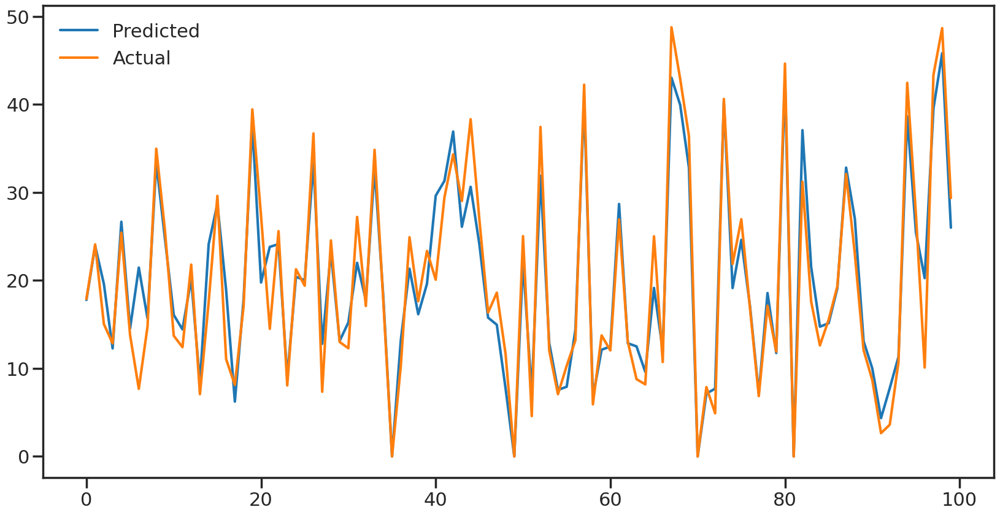

In [280]:
plt.figure(figsize=(20,10))
plt.plot((y_pred_rf)[:100])
plt.plot((np.array(y_test)[:100]))
plt.legend(["Predicted","Actual"])
plt.show()

In [281]:
# Now saving these metrics to our metrics dataframe. First we save them in a list and then we pass them to the df.
metric_df['Random_Forest'] = [MAE_rf, MSE_rf, RMSE_rf, R2_rf, Adjusted_R2_rf]
metric_df

,Metric,Linear Regression,Lasso,Lasso_cv,Ridge,Ridge_cv,Decision_Tree,Random_Forest
0,Mean Absolute Error,269.9089,269.9117,270.0498,269.9100,269.9644,243.1810,119.9987
1,Mean squared Error,155855.0351,155858.3841,156024.5980,155856.3865,155922.7626,124272.5173,39621.7555
2,Root Mean squared Error,394.7848,394.7890,394.9995,394.7865,394.8706,352.5231,199.0521
3,R2 score,0.6053,0.6053,0.6049,0.6053,0.6052,0.6853,0.8997
4,Adjusted R2 score,0.6020,0.6020,0.6020,0.6020,0.6020,0.6830,0.8990


#### 2. Cross- Validation & Hyperparameter Tuning

In [282]:
# ML Model - 5 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# Number of trees
n_estimators = [50,80,100]


# Maximum depth of trees
max_depth = [4,6,8]


# Minimum number of samples required to split a node
min_samples_split = [50,100,150]

# Minimum number of samples required at each leaf node
min_samples_leaf = [40,50]

# HYperparameter Grid
param_dict = {'n_estimators' : n_estimators,
              'max_depth' : max_depth,
              'min_samples_split' : min_samples_split,
              'min_samples_leaf' : min_samples_leaf}


# Create an instance of the RandomForestClassifier
rf_model = RandomForestRegressor()


# Grid search
rf_grid = GridSearchCV(estimator=rf_model,
                       param_grid = param_dict,
                       cv = 5, verbose=2, scoring='r2')



# Fit the Algorithm
rf_grid.fit(x_train,y_train)


Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.4s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.4s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.4s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.4s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   0.4s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   0.6s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   0.6s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   0.6s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   0.7s
[CV] END max_depth=4, min_sam

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [4, 6, 8], 'min_samples_leaf': [40, 50],
                         'min_samples_split': [50, 100, 150],
                         'n_estimators': [50, 80, 100]},
             scoring='r2', verbose=2)

In [283]:
#best parameter
print("Best: %f using %s" % (rf_grid.best_score_, rf_grid.best_params_))

Best: 0.827303 using {'max_depth': 8, 'min_samples_leaf': 40, 'min_samples_split': 100, 'n_estimators': 50}


In [284]:
# Predict on the model
# Making predictions on train and test data
y_pred_train_rf_cv= rf_grid.predict(x_train)
y_pred_rf_cv = rf_grid.predict(x_test)

In [285]:
r2_score(y_train**2,y_pred_train_rf_cv**2)

0.8377543601216044

In [286]:
# Visualizing evaluation Metric Score chart
# Calculating the performance metrics.
MAE_rf_cv= round(mean_absolute_error((y_test)**2,(y_pred_rf_cv)**2),4)
print(f"Mean Absolute Error : {MAE_rf_cv}")

MSE_rf_cv = round(mean_squared_error((y_test)**2,(y_pred_rf_cv)**2),4)
print(f"Mean squared Error : {MSE_rf_cv}")

RMSE_rf_cv = round(np.sqrt(MSE_rf_cv),4)
print(f"Root Mean squared Error : {RMSE_rf_cv}")

R2_rf_cv = round(r2_score((y_test)**2, (y_pred_rf_cv)**2),4)
print(f"R2 score : {R2_rf_cv}")

Adjusted_R2_rf_cv = round(1-(1-r2_score(y_test**2,y_pred_rf_cv**2))*((x_test.shape[0]-1)/(x_test.shape[0]-x_test.shape[1]-1)),3)
print(f"Adjusted R2 score : {Adjusted_R2_rf_cv}")


Mean Absolute Error : 169.902
Mean squared Error : 71356.4042
Root Mean squared Error : 267.1262
R2 score : 0.8193
Adjusted R2 score : 0.818


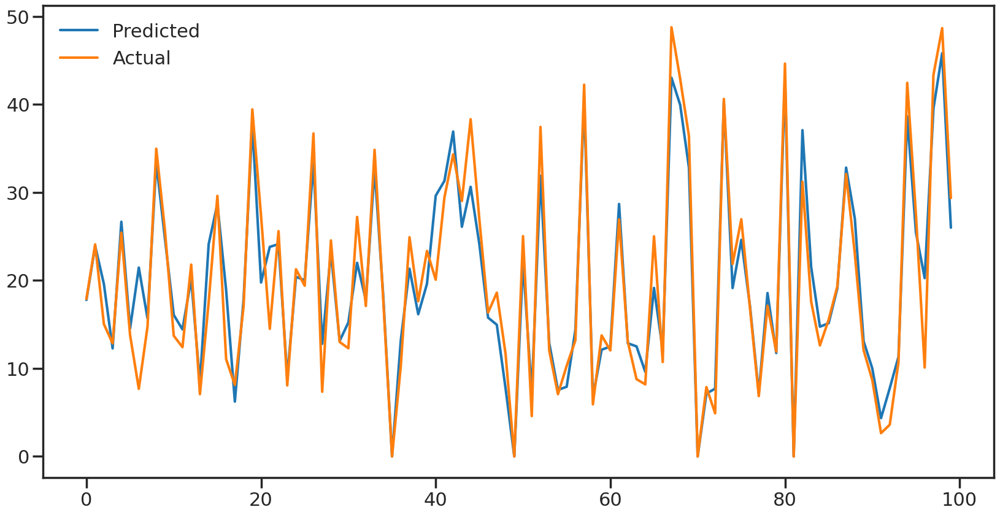

In [287]:
plt.figure(figsize=(20,10))
plt.plot((y_pred_rf)[:100])
plt.plot((np.array(y_test)[:100]))
plt.legend(["Predicted","Actual"])
plt.show()

In [288]:
# Now saving these metrics to our metrics dataframe. First we save them in a list and then we pass them to the df.
metric_df['Random_Forest_cv'] = [MAE_rf_cv, MSE_rf_cv, RMSE_rf_cv, R2_rf_cv, Adjusted_R2_rf_cv]
metric_df

,Metric,Linear Regression,Lasso,Lasso_cv,Ridge,Ridge_cv,Decision_Tree,Random_Forest,Random_Forest_cv
0,Mean Absolute Error,269.9089,269.9117,270.0498,269.9100,269.9644,243.1810,119.9987,169.9020
1,Mean squared Error,155855.0351,155858.3841,156024.5980,155856.3865,155922.7626,124272.5173,39621.7555,71356.4042
2,Root Mean squared Error,394.7848,394.7890,394.9995,394.7865,394.8706,352.5231,199.0521,267.1262
3,R2 score,0.6053,0.6053,0.6049,0.6053,0.6052,0.6853,0.8997,0.8193
4,Adjusted R2 score,0.6020,0.6020,0.6020,0.6020,0.6020,0.6830,0.8990,0.8180


##### Which hyperparameter optimization technique have you used and why?

GridSearchCV which uses the Grid Search technique for finding the optimal hyperparameters to increase the model performance.

our goal should be to find the best hyperparameters values to get the perfect prediction results from our model. But the question arises, how to find these best sets of hyperparameters? One can try the Manual Search method, by using the hit and trial process and can find the best hyperparameters which would take huge time to build a single model.

For this reason, methods like Random Search, GridSearch were introduced. Grid Search uses a different combination of all the specified hyperparameters and their values and calculates the performance for each combination and selects the best value for the hyperparameters. This makes the processing time-consuming and expensive based on the number of hyperparameters involved.

In GridSearchCV, along with Grid Search, cross-validation is also performed. Cross-Validation is used while training the model.

That's why I have used GridsearCV method for hyperparameter optimization.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Before hyperparameter tuning model was overfitting as model has a very large difference in training and test score, which was reduced from 0.98 in training to 0.84 and test result from 0.9 to 0.81 which is also has slight difference but overall model is efficient now compared to earlier.

### ML Model - 6  eXtreme Gradient Boosting.

In [289]:
#importing XGBoost Regressor
from xgboost import XGBRegressor

In [290]:
#creating Xgboost model
xgb_model=XGBRegressor()

In [291]:
#getting params of xgboost
xgb_model.get_params()

{'objective': 'reg:squarederror',
 'base_score': None,
 'booster': None,
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': None,
 'gpu_id': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'n_estimators': 100,
 'n_jobs': None,
 'num_parallel_tree': None,
 'predictor': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

In [292]:
xgb_model.fit(x_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [293]:
y_pred_train_xgb = xgb_model.predict(x_train)

In [294]:
y_pred_xgb = xgb_model.predict(x_test)

In [295]:
r2_score(((y_train)**2),((y_pred_train_xgb)**2))

0.9715604106079656

In [296]:
r2_score(((y_test)**2),((y_pred_xgb)**2))

0.9028440926256787


1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.


In [297]:
# Calculating the performance metrics.
MAE_xgb= round(mean_absolute_error((y_test)**2,(y_pred_xgb)**2),4)
print(f"Mean Absolute Error : {MAE_xgb}")

MSE_xgb = round(mean_squared_error((y_test)**2,(y_pred_xgb)**2),4)
print(f"Mean squared Error : {MSE_xgb}")

RMSE_xgb = round(np.sqrt(MSE_xgb),4)
print(f"Root Mean squared Error : {RMSE_xgb}")

R2_xgb = round(r2_score((y_test)**2, (y_pred_xgb)**2),4)
print(f"R2 score : {R2_xgb}")

Adjusted_R2_xgb = round(1-(1-r2_score(y_test**2,y_pred_xgb**2))*((x_test.shape[0]-1)/(x_test.shape[0]-x_test.shape[1]-1)),3)
print(f"Adjusted R2 score : {Adjusted_R2_xgb}")


Mean Absolute Error : 119.7193
Mean squared Error : 38366.8644
Root Mean squared Error : 195.8746
R2 score : 0.9028
Adjusted R2 score : 0.902


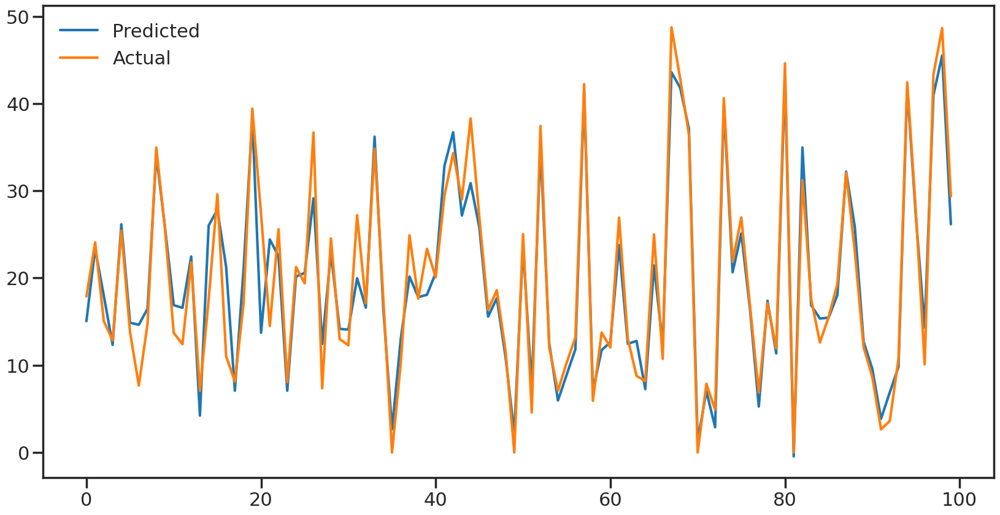

In [298]:
plt.figure(figsize=(20,10))
plt.plot((y_pred_xgb)[:100])
plt.plot((np.array(y_test)[:100]))
plt.legend(["Predicted","Actual"])
plt.show()

#### 2. Cross- Validation & Hyperparameter Tuning

In [299]:
#creating param dict for gridsearch
n_estimators=[80,100,150]
max_depth=[15,20,30]

params = {'n_estimators':n_estimators,'max_depth':max_depth }

In [300]:
#creating xgb grid model
xgb_grid= GridSearchCV(xgb_model,param_grid=params,verbose=0)

In [301]:
xgb_grid.fit(x_train, y_train)

GridSearchCV(estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None, gpu_id=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, max_bin=None,
                                    max_cat_threshold=None,
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None, n_estimators=100,
                                    n_jobs=None, num_parallel_tree=None,
                                    predictor=None, random_state=None, ...),
             param_grid={'max_depth': [15, 20, 30],
                         'n_estimators': [80, 100, 150]})

In [302]:
y_pred_train_xgb_cv = xgb_grid.predict(x_train)

In [303]:
y_pred_xgb_cv = xgb_grid.predict(x_test)

In [304]:
r2_score(((y_train)**2),((y_pred_train_xgb_cv)**2))

0.99999997421838

In [305]:
r2_score(((y_test)**2),((y_pred_xgb_cv)**2))

0.9003445493964761


1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.


In [306]:
# Calculating the performance metrics.
MAE_xgb_cv= round(mean_absolute_error((y_test)**2,(y_pred_xgb_cv)**2),4)
print(f"Mean Absolute Error : {MAE_xgb_cv}")

MSE_xgb_cv = round(mean_squared_error((y_test)**2,(y_pred_xgb_cv)**2),4)
print(f"Mean squared Error : {MSE_xgb_cv}")

RMSE_xgb_cv = round(np.sqrt(MSE_xgb_cv),4)
print(f"Root Mean squared Error : {RMSE_xgb_cv}")

R2_xgb_cv = round(r2_score((y_test)**2, (y_pred_xgb_cv)**2),4)
print(f"R2 score : {R2_xgb_cv}")

Adjusted_R2_xgb_cv = round(1-(1-r2_score(y_test**2,y_pred_xgb_cv**2))*((x_test.shape[0]-1)/(x_test.shape[0]-x_test.shape[1]-1)),3)
print(f"Adjusted R2 score : {Adjusted_R2_xgb_cv}")


Mean Absolute Error : 117.4013
Mean squared Error : 39353.9339
Root Mean squared Error : 198.3783
R2 score : 0.9003
Adjusted R2 score : 0.9


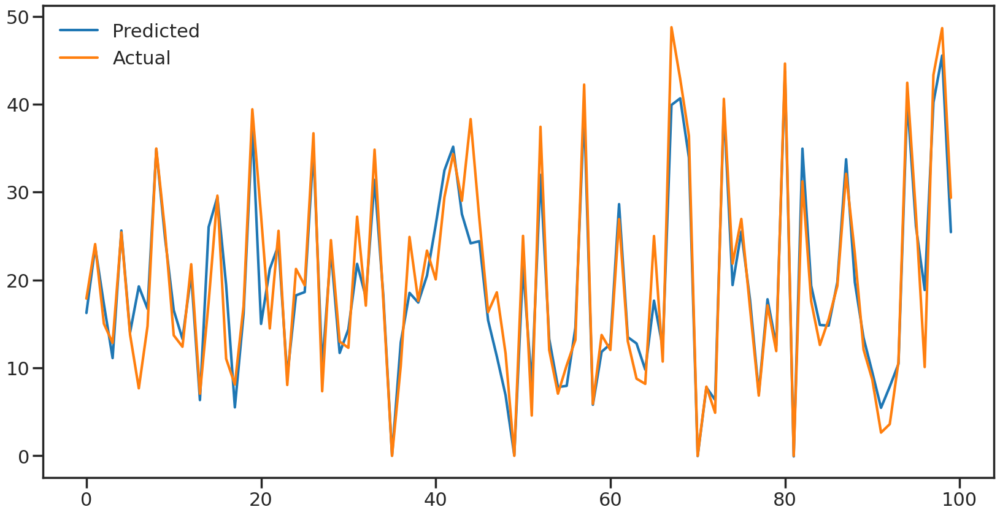

In [307]:
plt.figure(figsize=(20,10))
plt.plot((y_pred_xgb_cv)[:100])
plt.plot((np.array(y_test)[:100]))
plt.legend(["Predicted","Actual"])
plt.show()

In [317]:
# Now saving these metrics to our metrics dataframe. First we save them in a list and then we pass them to the df.
metric_df['Xg_boost_cv'] = [MAE_xgb_cv, MSE_xgb_cv, RMSE_xgb_cv, R2_xgb_cv, Adjusted_R2_xgb_cv]
metric_df


,Metric,Linear Regression,Lasso,Lasso_cv,Ridge,Ridge_cv,Decision_Tree,Random_Forest,Random_Forest_cv,Xg_boost_cv
0,Mean Absolute Error,269.9089,269.9117,270.0498,269.9100,269.9644,243.1810,119.9987,169.9020,117.4013
1,Mean squared Error,155855.0351,155858.3841,156024.5980,155856.3865,155922.7626,124272.5173,39621.7555,71356.4042,39353.9339
2,Root Mean squared Error,394.7848,394.7890,394.9995,394.7865,394.8706,352.5231,199.0521,267.1262,198.3783
3,R2 score,0.6053,0.6053,0.6049,0.6053,0.6052,0.6853,0.8997,0.8193,0.9003
4,Adjusted R2 score,0.6020,0.6020,0.6020,0.6020,0.6020,0.6830,0.8990,0.8180,0.9000


### 2. Which ML model did you choose from the above created models as your final prediction model and why?

Based on the results, I want to consider using the Xg_boost_cv i.e., XGBRegressor with hyperparameter tunned model as final model. This model has the highest R2 values on test sets, which indicates that it is doing a good job of explaining the variance in the target variable. It also has the lowest MAE and RMSE values on the test set, which means that it is making relatively small and accurate predictions.

### 3. Explain the model which you have used and the feature importance using any model explainability tool?

Answer Here.

In [309]:
#creating function to get features importance of all the tree based model
def get_features_importance(optimal_model,X_train):
  imp_feat=pd.DataFrame(index=X_train.columns,data=optimal_model.feature_importances_,columns=['importance'])
  imp_feat=imp_feat[imp_feat['importance']>0]
  imp_feat=imp_feat.sort_values('importance')
  plt.figure(figsize=(15,5))
  print(f'==========================Features Importance============================\n\n {optimal_model}\
  \n=========================================================================\n') 
  sns.barplot(data=imp_feat,x=imp_feat.index,y='importance')
  plt.xticks(rotation=90);
   

In [310]:
#getting best estimator of xgb model given by xgb grid model
optimal_xgb_model=xgb_grid.best_estimator_

In [311]:
# Train - Spliting  data
X= (df_2[independent_variables])
Y =(np.sqrt(df_2[dependent_variable])).values 

In [312]:
# splitting the data into a train and a test set. we do this using train test split.
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = 0)  

==========================Features Importance============================

 XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=15, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=150, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)  



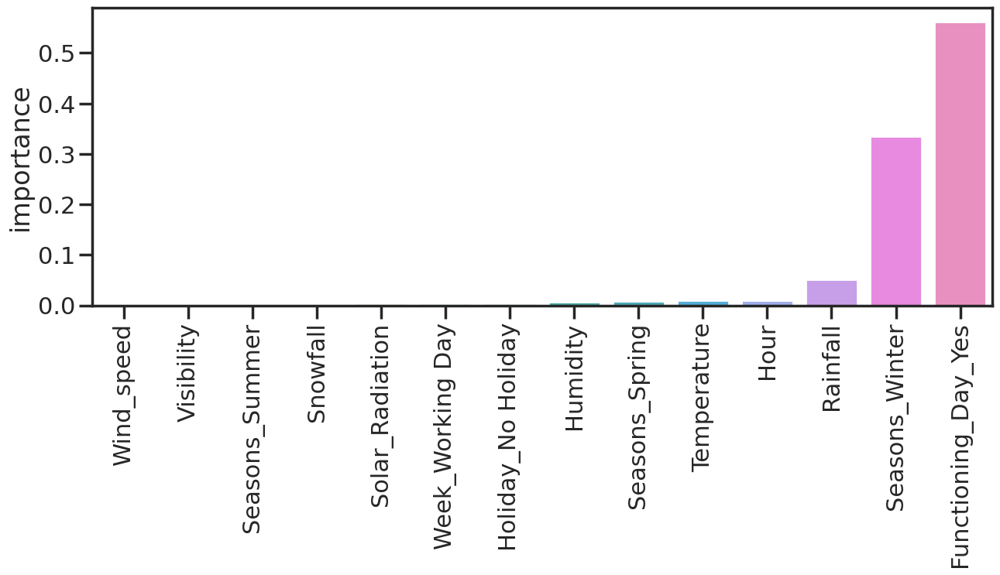

In [313]:
#getting best param of Xgb model given by xgb_grid model
get_features_importance(optimal_xgb_model,X_train)

## ***7.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [314]:
# Save the File

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [315]:
# Load the File and predict unseen data.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

The main goal of the project was to stablize bike demand at every hour. Based on the objective, it was found that:

* XGBRegressor models with hyperparameter tuning and CV shows promising result with R2 score of 0.9, therefore it can be used to solve this problem.

* Bike rental count is high during working days than on weekend.

* Bike demand shows peek around 8-9 AM in the morning and 6 - 7pm in the evening.

* People prefer to rent bike more in summer than in winter.

* Bike demand is more on clear days than on snowy or rainy days.

* Temperature range from 22 to 25(°C) has more demand for bike.

* 'Hour', 'Temperature(°C)', 'Humidity', 'Wind_speed','Visibility ', 'Solar_Radiation', 'Rainfall', 'Snowfall', 'Seasons', 'day of week ' regulates bike demand.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***